In [2]:
from google.colab import drive
drive.mount("content/", force_remount=True)
%cd "content/MyDrive/Capstone/rohlik-orders-forecasting-challenge"
%pwd

Mounted at content/
/content/content/MyDrive/Capstone/rohlik-orders-forecasting-challenge


'/content/content/MyDrive/Capstone/rohlik-orders-forecasting-challenge'

In [177]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PowerTransformer
from datetime import datetime, timedelta
import plotly.express as px


# Task Description
Rohlik Group, a leading European e-grocery innovator, is revolutionising the food retail industry. We operate across 11 warehouses in Czech Republic, Germany, Austria, Hungary, and Romania.

You are provided with historical orders data for selected Rohlik warehouses. The task is to forecast the "orders" column for the test set. Some features are not available in test as they are not known at the moment of making the prediction (e.g. precipitation, shutdown, user activity on website). These are market in the description below.

In [91]:
train_orders_data = pd.read_csv("train.csv")
train_calendar = pd.read_csv("train_calendar.csv")

test_orders_data = pd.read_csv("test.csv")
test_calendar = pd.read_csv("test_calendar.csv")

In [7]:
print(f"train_orders_data {train_orders_data.shape}")
train_orders_data.head(1)

train_orders_data (7340, 18)


,warehouse,date,orders,holiday_name,holiday,shutdown,mini_shutdown,shops_closed,winter_school_holidays,school_holidays,blackout,mov_change,frankfurt_shutdown,precipitation,snow,user_activity_1,user_activity_2,id
0,Prague_1,2020-12-05,6895.0,NaN,0,0,0,0,0,0,0,0.0,0,0.0,0.0,1722.0,32575.0,Prague_1_2020-12-05


In [8]:
print(f"train_calendar {train_calendar.shape}")
train_calendar.head(1)

train_calendar (13307, 15)


,date,holiday_name,holiday,shutdown,mini_shutdown,warehouse_limited,shops_closed,winter_school_holidays,school_holidays,blackout,mov_change,frankfurt_shutdown,precipitation,snow,warehouse
0,2022-03-09,NaN,0,0,0,0,0,1,0,0,0.0,0,0.0,0.0,Prague_1


In [9]:
train_orders_data['mov_change'].unique()

array([0. , 1. , 0.7])

In [10]:
train_orders_data.describe()

,orders,holiday,shutdown,mini_shutdown,shops_closed,winter_school_holidays,school_holidays,blackout,mov_change,frankfurt_shutdown,precipitation,snow,user_activity_1,user_activity_2
count,7340.000000,7340.000000,7340.000000,7340.000000,7340.000000,7340.000000,7340.000000,7340.000000,7340.000000,7340.000000,7070.000000,7070.000000,7340.000000,7340.000000
mean,5535.443869,0.027248,0.000136,0.000545,0.010899,0.029973,0.007084,0.000954,0.221499,0.000272,1.621126,0.290112,1633.545777,23477.031335
std,2182.680279,0.162816,0.011672,0.023340,0.103836,0.170524,0.083876,0.030869,0.410293,0.016506,4.542875,1.546102,784.167637,8934.848328
min,790.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,482.000000,1797.000000
25%,4434.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,945.000000,18509.000000
50%,5370.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1349.000000,22267.000000
75%,7009.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,2308.000000,30028.750000
max,18139.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,80.000000,19.840000,3437.000000,45769.000000


holiday, mini_shutdown, shops_closed, winter_school_holidays, school_holidays, blackout, frankfurt_shutdown are binary variables

In [11]:
train_orders_data['holiday'].unique()

array([0, 1])

In [5]:
closed_flags = ['holiday', 'mini_shutdown', 'shops_closed', 'winter_school_holidays', 'school_holidays', 'blackout', 'frankfurt_shutdown']
for flag in closed_flags:
  if not np.all(np.equal(train_orders_data[flag].unique(), np.array([0, 1]))):
    print(f"flag {flag} is not binary")

In [95]:
len(train_orders_data['holiday_name'].unique())

25

In [112]:
print(train_orders_data['mini_shutdown'].value_counts())
train_orders_data.groupby('warehouse')['mini_shutdown'].sum()

mini_shutdown
0    7336
1       4
Name: count, dtype: int64


,mini_shutdown
warehouse,
Brno_1,1
Budapest_1,0
Frankfurt_1,0
Munich_1,0
Prague_1,1
Prague_2,1
Prague_3,1


In [113]:
print(train_orders_data['shops_closed'].value_counts())
train_orders_data.groupby('warehouse')['shops_closed'].sum()

shops_closed
0    7260
1      80
Name: count, dtype: int64


,shops_closed
warehouse,
Brno_1,20
Budapest_1,0
Frankfurt_1,0
Munich_1,0
Prague_1,20
Prague_2,20
Prague_3,20


In [114]:
print(train_orders_data['winter_school_holidays'].value_counts())
train_orders_data.groupby('warehouse')['winter_school_holidays'].sum()

winter_school_holidays
0    7120
1     220
Name: count, dtype: int64


,winter_school_holidays
warehouse,
Brno_1,28
Budapest_1,6
Frankfurt_1,17
Munich_1,29
Prague_1,84
Prague_2,28
Prague_3,28


In [115]:
print(train_orders_data['school_holidays'].value_counts())
train_orders_data.groupby('warehouse')['school_holidays'].sum()

school_holidays
0    7288
1      52
Name: count, dtype: int64


,school_holidays
warehouse,
Brno_1,0
Budapest_1,0
Frankfurt_1,24
Munich_1,28
Prague_1,0
Prague_2,0
Prague_3,0


In [116]:
print(train_orders_data['blackout'].value_counts())
train_orders_data.groupby('warehouse')['blackout'].sum()

blackout
0    7333
1       7
Name: count, dtype: int64


,blackout
warehouse,
Brno_1,1
Budapest_1,1
Frankfurt_1,1
Munich_1,1
Prague_1,1
Prague_2,1
Prague_3,1


In [117]:
print(train_orders_data['frankfurt_shutdown'].value_counts())
train_orders_data.groupby('warehouse')['frankfurt_shutdown'].sum()

frankfurt_shutdown
0    7338
1       2
Name: count, dtype: int64


,frankfurt_shutdown
warehouse,
Brno_1,0
Budapest_1,0
Frankfurt_1,2
Munich_1,0
Prague_1,0
Prague_2,0
Prague_3,0


## Investigate & Compare train_orders_data and train_calendar

In [13]:
def null_percent_table(df):
  total_rows = pd.DataFrame([len(df)]*len(df.columns), index=df.columns).iloc[:, 0]
  null_features = pd.DataFrame( [df.isnull().sum(),  total_rows], index = ['# null', '% null']).transpose()
  null_features['% null'] = null_features['% null'].astype(float)
  null_features.loc[:, '% null'] = (null_features.loc[:, '# null']/null_features.loc[:, '% null'])*100
  return null_features.loc[null_features['# null'] != 0]

In [14]:
null_percent_table(train_orders_data)

,# null,% null
holiday_name,7122,97.029973
precipitation,270,3.678474
snow,270,3.678474


In [15]:
null_percent_table(train_calendar)

,# null,% null
holiday_name,12744,95.769144
precipitation,2108,15.841287
snow,2108,15.841287


We can see that around 3% of the data are holidays in train_orders_data. Around 5% is null in train_calendar

Let's compare the holidays and shops being closed between the orders data and calendar.

In [16]:
train_calendar.loc[: , 'id'] = train_calendar['warehouse'] + "_" + train_calendar['date']

In [17]:
train_orders_holiday = train_orders_data[['id', 'warehouse', 'date', 'holiday_name', 'holiday', 'shops_closed']]
train_orders_holiday.shape

(7340, 6)

In [18]:
train_calendar_holiday = train_calendar[['id', 'warehouse', 'date', 'holiday_name', 'holiday', 'shops_closed']]
train_calendar_holiday.shape

(13307, 6)

In [19]:
common_rows = pd.merge(train_orders_holiday, train_calendar_holiday, how='inner', on=['id'])
common_rows.drop(columns=[col for col in common_rows.columns if 'y' in col], inplace=True)
common_rows.columns = [col.split('_')[0] if 'x' in col else col for col in common_rows.columns ]
print(f"common_rows.shape: {common_rows.shape}")
different_rows = train_calendar_holiday[~train_calendar_holiday['id'].isin(common_rows['id'])]
print(f"different_rows.shape: {different_rows.shape}")
null_percent_table(different_rows)

common_rows.shape: (7340, 4)
different_rows.shape: (5967, 6)


,# null,% null
holiday_name,5622,94.2182


In [20]:
train_nonnull_holiday_name = different_rows.loc[ ~pd.isnull(different_rows['holiday_name']) ]
print(f"Of different rows, train_nonnull_holiday_name {train_nonnull_holiday_name.shape}")
train_nonnull_holiday_name.head(2)


Of different rows, train_nonnull_holiday_name (345, 6)


,id,warehouse,date,holiday_name,holiday,shops_closed
22,Prague_1_2020-04-10,Prague_1,2020-04-10,Good Friday,1,0
53,Prague_1_2019-04-22,Prague_1,2019-04-22,Easter Monday,1,1


In [21]:
train_null_holiday_name = different_rows.loc[ pd.isnull(different_rows['holiday_name']) ]
print(f"Of different rows, train_null_holiday_name {train_null_holiday_name.shape}")
train_null_holiday_name.head(2)

Of different rows, train_null_holiday_name (5622, 6)


,id,warehouse,date,holiday_name,holiday,shops_closed
1,Prague_1_2019-07-03,Prague_1,2019-07-03,NaN,0,0
2,Prague_1_2020-05-18,Prague_1,2020-05-18,NaN,0,0


All 7340 data points in the train_orders_data are also in the train_calendar.

There are some amount of holidays and additional incomplete non-holiday data points that are in the train_calendar, but not in the train_orders_data.

The train_orders data also has user activity 1 and user activity 2 features which train_calendar does not have.

If needed, we could later on experiment imputing the values for these 2 features and increase our train_orders_dataset

## Observe distributions of train_orders_data

### Warehouse distribution

In [22]:
def cat_plot(feature, df=train_orders_data):
  warehouse_count = round(df[feature].value_counts()*100, 2).reset_index()
  warehouse_count.columns = [feature, 'count']
  warehouse_dist = round(df[feature].value_counts(normalize=True)*100, 2).reset_index()
  warehouse_dist.columns = [feature, 'percent']
  warehouse_info = pd.merge(warehouse_dist, warehouse_count)
  ax = sns.barplot(x='count', y=feature, data=warehouse_count, color='deepskyblue')
  custom_labels = [ str(count)+ "    ("+ str(percent) + "%)" for count, percent in zip(warehouse_info['count'], warehouse_info['percent']) ]
  ax.bar_label(ax.containers[0], padding=0, labels=custom_labels, fontsize=11, label_type='center', color="black")
  ax.set_title(f"{feature}")
  return ax

<Axes: title={'center': 'Number of samples/rows per warehouse'}, xlabel='count', ylabel='warehouse'>

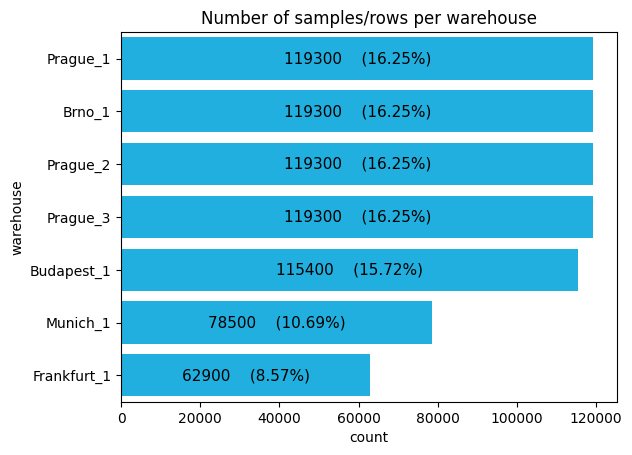

In [23]:
ax = cat_plot("warehouse")
ax.set_title("Number of samples/rows per warehouse")
ax

### Total Orders Distributions

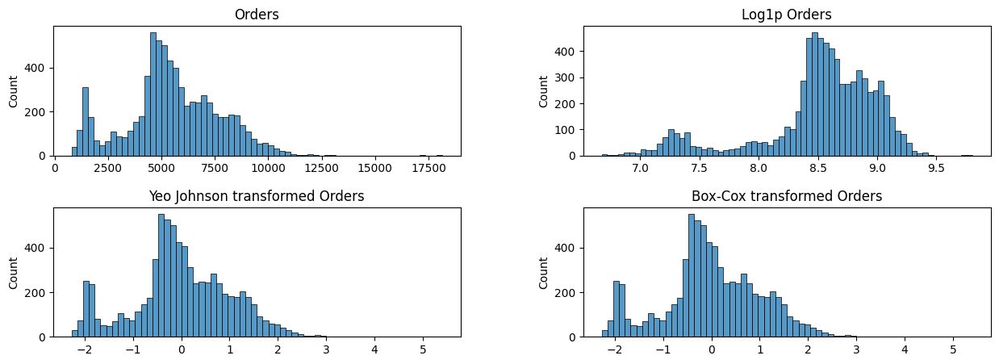

In [24]:
yeo_johnson_transformer = PowerTransformer(method='yeo-johnson')
boxcox_transformer = PowerTransformer(method='box-cox')

yeo_johnson_transformed = yeo_johnson_transformer.fit_transform(train_orders_data['orders'].to_numpy().reshape(-1, 1)).squeeze()
boxcox_transformed = boxcox_transformer.fit_transform(train_orders_data['orders'].to_numpy().reshape(-1, 1)).squeeze()

fig, axes = plt.subplots(2, 2, figsize=(15, 5))
fig.subplots_adjust(wspace=0.3, hspace=0.4)

sns.histplot(train_orders_data['orders'], ax=axes[0][0])
axes[0][0].set_title("Orders")
axes[0][0].set_xlabel("")

sns.histplot(np.log1p(train_orders_data['orders']), ax=axes[0][1])
axes[0][1].set_title("Log1p Orders")
axes[0][1].set_xlabel("")

sns.histplot(yeo_johnson_transformed, ax=axes[1][0])
axes[1][0].set_title("Yeo Johnson transformed Orders")
axes[0][1].set_xlabel("")

sns.histplot(boxcox_transformed, ax=axes[1][1])
axes[1][1].set_title("Box-Cox transformed Orders")
axes[1][1].set_xlabel("")

fig.show()

Orders is bimodal.

## Total Orders by Warehouse

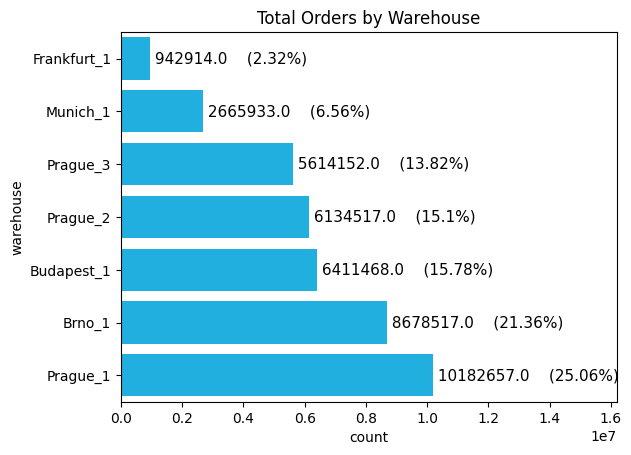

In [25]:
df = train_orders_data[['warehouse', 'orders']].groupby(['warehouse']).sum().sort_values(by=['orders'])
feature = train_orders_data.columns[0]
df = df.reset_index()
total_rows = pd.DataFrame([df.iloc[:, 1].sum()]*len(df.index)).iloc[:, 0]
feature_info = pd.DataFrame( [df.iloc[:, 0], df.iloc[:, 1],  total_rows], index = [feature, 'count', 'percent']).transpose()
feature_info['percent'] = feature_info['percent'].astype('float64')
feature_info['count'] = feature_info['count'].astype('float64')
feature_info.loc[:, 'percent'] = (feature_info.loc[:, 'count']/feature_info.loc[:, 'percent'])*100
feature_info['percent'] = feature_info['percent'].astype('float64').round(2)

fig, ax = plt.subplots()
sns.barplot(x='count', y=feature, data=feature_info, color='deepskyblue', ax=ax)
custom_labels = [ " " + str(count)+ "    ("+ str(percent) + "%)" for count, percent in zip(feature_info['count'], feature_info['percent']) ]
ax.bar_label(ax.containers[0], padding=0, labels=custom_labels, fontsize=11, label_type='edge', color="black")
ax.set_xlim((0, 16_200_000))
ax.set_title("Total Orders by Warehouse")
fig.show()

## Holiday_name

Text(0.5, 0, '')

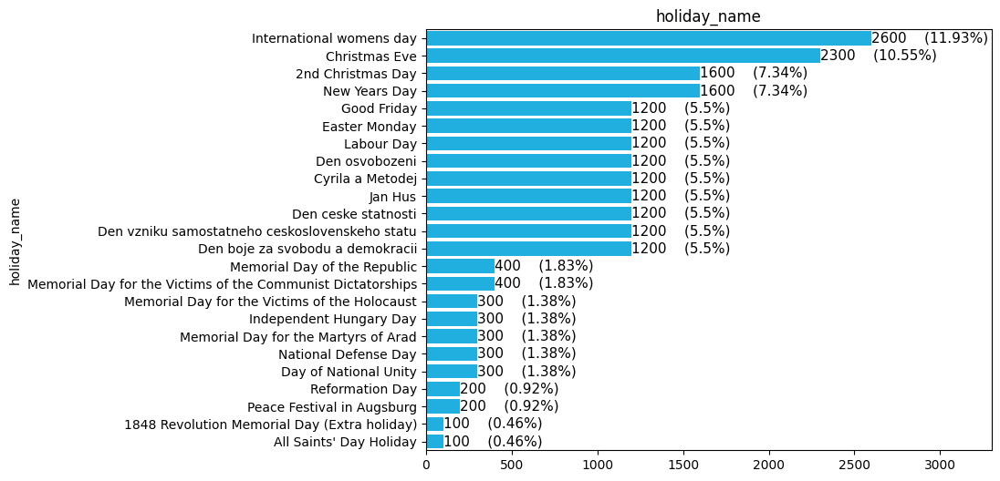

In [26]:
fig, ax = plt.subplots(figsize=(8, 6))
feature = "holiday_name"
warehouse_count = round(train_orders_data[feature].value_counts()*100, 2).reset_index()
warehouse_count.columns = [feature, 'count']
warehouse_dist = round(train_orders_data[feature].value_counts(normalize=True)*100, 2).reset_index()
warehouse_dist.columns = [feature, 'percent']
warehouse_info = pd.merge(warehouse_dist, warehouse_count)
ax = sns.barplot(x='count', y=feature, data=warehouse_count, color='deepskyblue')
custom_labels = [ str(count)+ "    ("+ str(percent) + "%)" for count, percent in zip(warehouse_info['count'], warehouse_info['percent']) ]
ax.bar_label(ax.containers[0], padding=0, labels=custom_labels, fontsize=11, label_type='edge', color="black")
ax.set_title(f"{feature}")
ax.set_xlim((0, 3300))
ax.set_xlabel("")

## Holidays in each warehouse

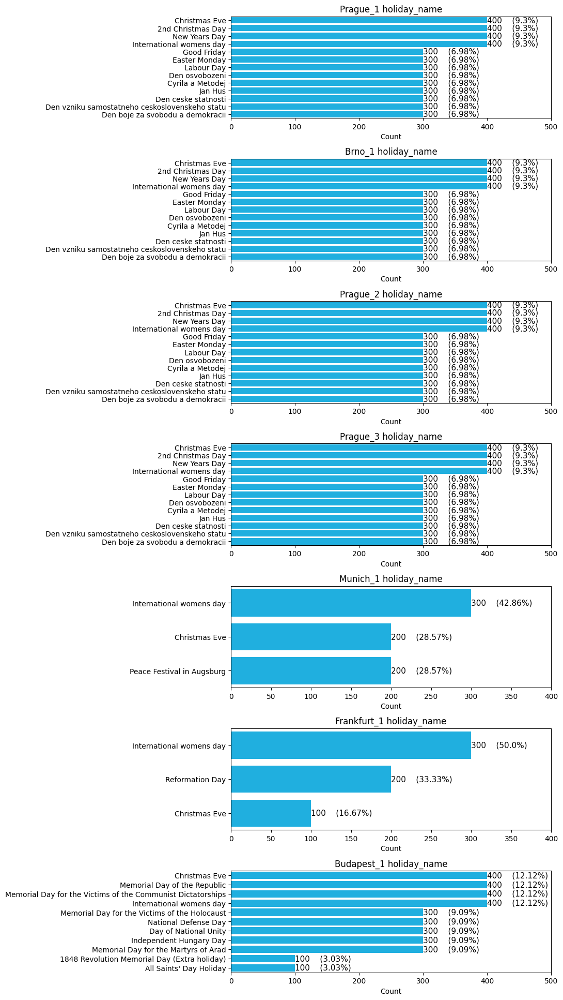

In [34]:
fig, axes = plt.subplots(7, 1, figsize=(8, 24))
fig.subplots_adjust(wspace=0.3, hspace=0.4)

i = 0
j = 0
for warehouse in train_orders_data['warehouse'].unique():
  warehouse_subset_data = train_orders_data.loc[train_orders_data['warehouse'] == warehouse]
  feature = "holiday_name"
  warehouse_count = round(warehouse_subset_data[feature].value_counts()*100, 2).reset_index()
  warehouse_count.columns = [feature, 'count']
  warehouse_dist = round(warehouse_subset_data[feature].value_counts(normalize=True)*100, 2).reset_index()
  warehouse_dist.columns = [feature, 'percent']
  warehouse_info = pd.merge(warehouse_dist, warehouse_count)
  sns.barplot(x='count', y=feature, data=warehouse_count, color='deepskyblue', ax=axes[i])
  custom_labels = [ str(count)+ "    ("+ str(percent) + "%)" for count, percent in zip(warehouse_info['count'], warehouse_info['percent']) ]
  axes[i].bar_label(axes[i].containers[0], padding=0, labels=custom_labels, fontsize=11, label_type='edge', color="black")
  axes[i].set_title(f"{warehouse} {feature}")
  axes[i].set_xlim((0, max(warehouse_count['count']+ 100)))
  axes[i].set_xlabel("Count")
  axes[i].set_ylabel("")
  i += 1



## Date distribution

Text(0, 0.5, 'Count')

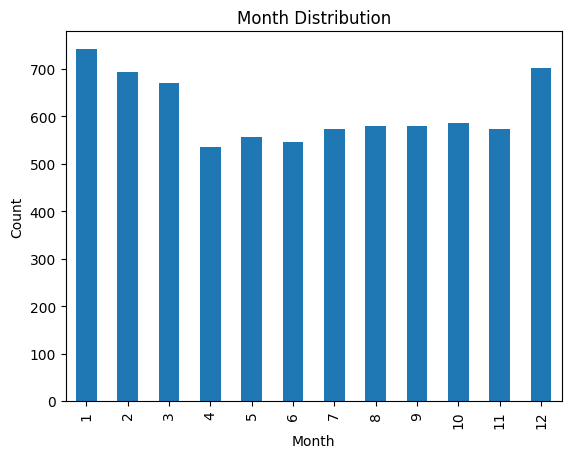

In [28]:
date_col = pd.to_datetime(train_orders_data['date'])
month_counts = date_col.dt.month.value_counts().sort_index()
ax = month_counts.plot(kind='bar')
ax.set_title("Month Distribution")
ax.set_xlabel("Month")
ax.set_ylabel("Count")

In [29]:
closed_flags

['holiday',
 'mini_shutdown',
 'shops_closed',
 'winter_school_holidays',
 'school_holidays',
 'blackout',
 'frankfurt_shutdown']

Text(0, 0.5, 'Count')

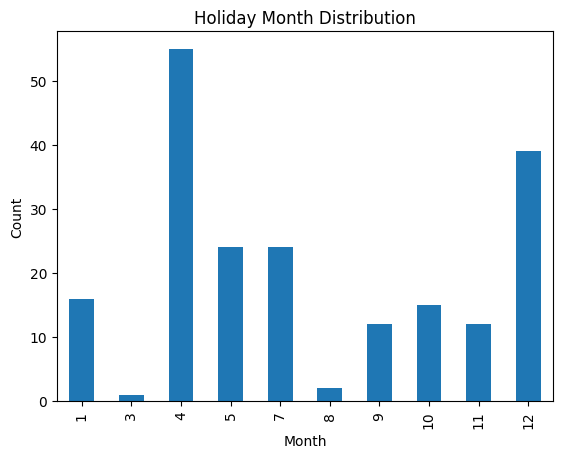

In [30]:


date_col = pd.to_datetime((train_orders_data[train_orders_data['holiday']==1])['date'])
month_counts = date_col.dt.month.value_counts().sort_index()
ax = month_counts.plot(kind='bar')
ax.set_title("Holiday Month Distribution")
ax.set_xlabel("Month")
ax.set_ylabel("Count")

Text(0, 0.5, 'Count')

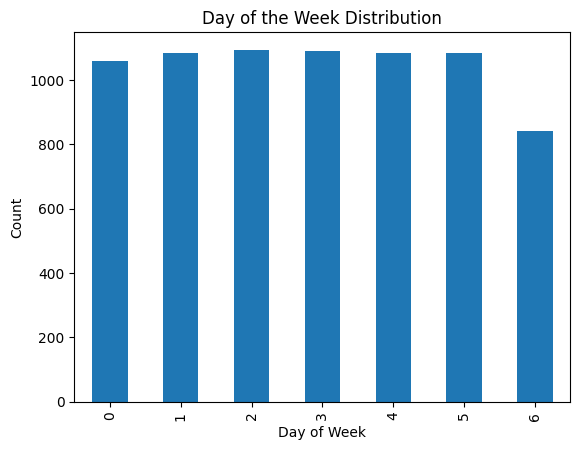

In [31]:
date_col = pd.to_datetime(train_orders_data['date'])
dayofweek_counts = date_col.dt.dayofweek.value_counts().sort_index()
ax = dayofweek_counts.plot(kind='bar')
ax.set_title("Day of the Week Distribution")
ax.set_xlabel("Day of Week")
ax.set_ylabel("Count")

Text(0, 0.5, 'Count')

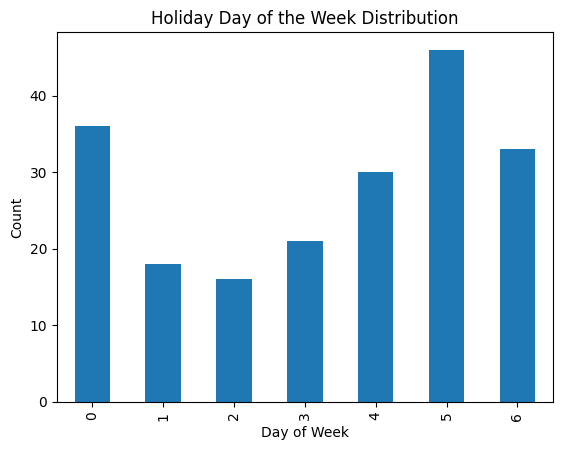

In [32]:
date_col = pd.to_datetime((train_orders_data[train_orders_data['holiday']==1])['date'])
dayofweek_counts = date_col.dt.dayofweek.value_counts().sort_index()
ax = dayofweek_counts.plot(kind='bar')
ax.set_title("Holiday Day of the Week Distribution")
ax.set_xlabel("Day of Week")
ax.set_ylabel("Count")

In [33]:
train_orders_data.columns

Index(['warehouse', 'date', 'orders', 'holiday_name', 'holiday', 'shutdown',
       'mini_shutdown', 'shops_closed', 'winter_school_holidays',
       'school_holidays', 'blackout', 'mov_change', 'frankfurt_shutdown',
       'precipitation', 'snow', 'user_activity_1', 'user_activity_2', 'id'],
      dtype='object')

## Holiday Type Distribution

Text(0.5, 0.98, 'Holiday Type')

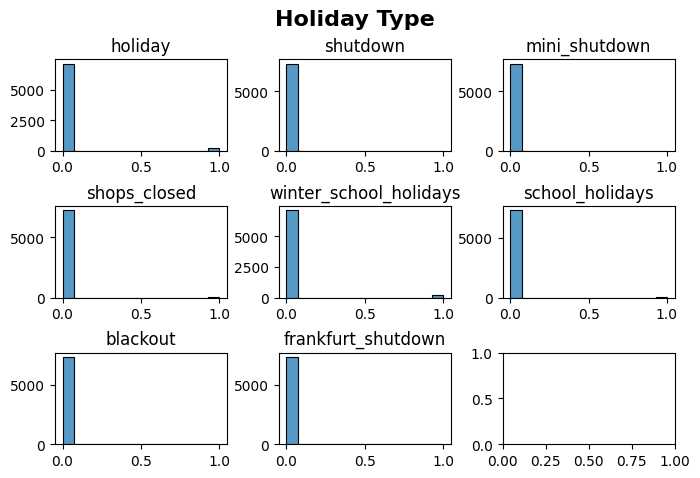

In [34]:
def check_binary_distributions(train_orders_data):
  fig, axes = plt.subplots(3, 3, figsize=(8, 5))
  fig.subplots_adjust(wspace=0.3, hspace=0.6)

  sns.histplot(train_orders_data['holiday'], ax=axes[0][0])
  axes[0][0].set_title("holiday")
  axes[0][0].set_ylabel("")
  axes[0][0].set_xlabel("")

  sns.histplot(train_orders_data['shutdown'], ax=axes[0][1])
  axes[0][1].set_title("shutdown")
  axes[0][1].set_ylabel("")
  axes[0][1].set_xlabel("")

  sns.histplot(train_orders_data['mini_shutdown'], ax=axes[0][2])
  axes[0][2].set_title("mini_shutdown")
  axes[0][2].set_xlabel("")
  axes[0][2].set_ylabel("")

  sns.histplot(train_orders_data['shops_closed'], ax=axes[1][0])
  axes[1][0].set_title("shops_closed")
  axes[1][0].set_xlabel("")
  axes[1][0].set_ylabel("")

  sns.histplot(train_orders_data['winter_school_holidays'], ax=axes[1][1])
  axes[1][1].set_title("winter_school_holidays")
  axes[1][1].set_xlabel("")
  axes[1][1].set_ylabel("")

  sns.histplot(train_orders_data['school_holidays'], ax=axes[1][2])
  axes[1][2].set_title("school_holidays")
  axes[1][2].set_xlabel("")
  axes[1][2].set_ylabel("")

  sns.histplot(train_orders_data['blackout'], ax=axes[2][0])
  axes[2][0].set_title("blackout")
  axes[2][0].set_xlabel("")
  axes[2][0].set_ylabel("")

  sns.histplot(train_orders_data['frankfurt_shutdown'], ax=axes[2][1])
  axes[2][1].set_title("frankfurt_shutdown")
  axes[2][1].set_xlabel("")
  axes[2][1].set_ylabel("")
  return fig


fig = check_binary_distributions(train_orders_data)
fig.suptitle('Holiday Type', fontsize=16, fontweight='bold')


## Holiday Type Distribution by Warehouse

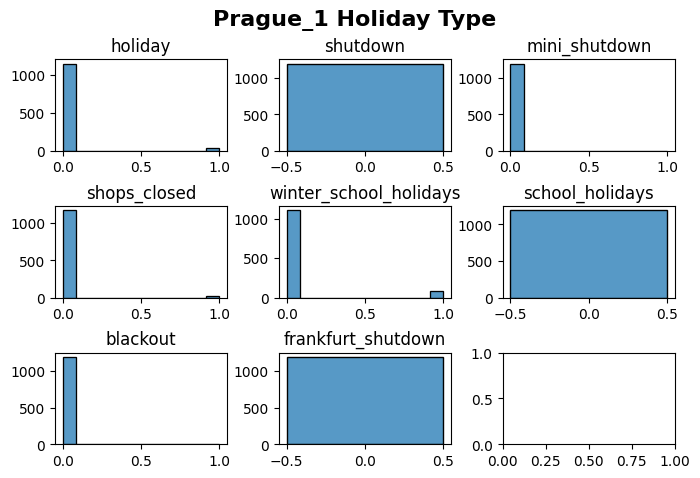

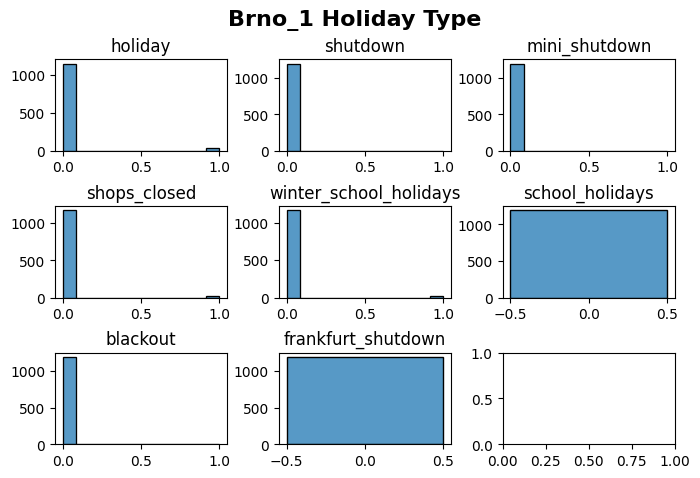

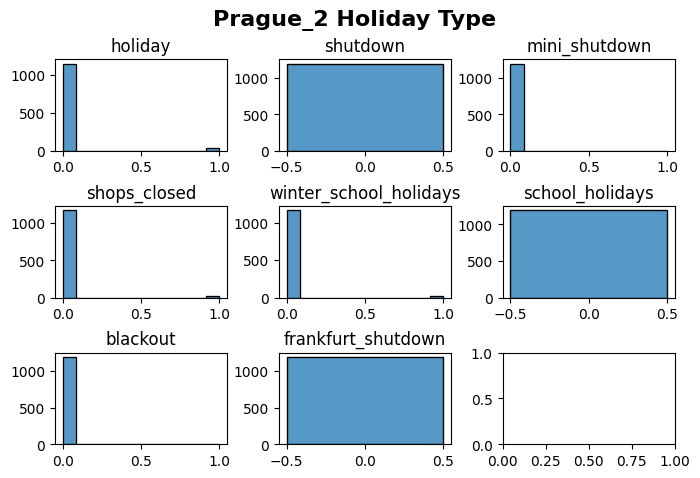

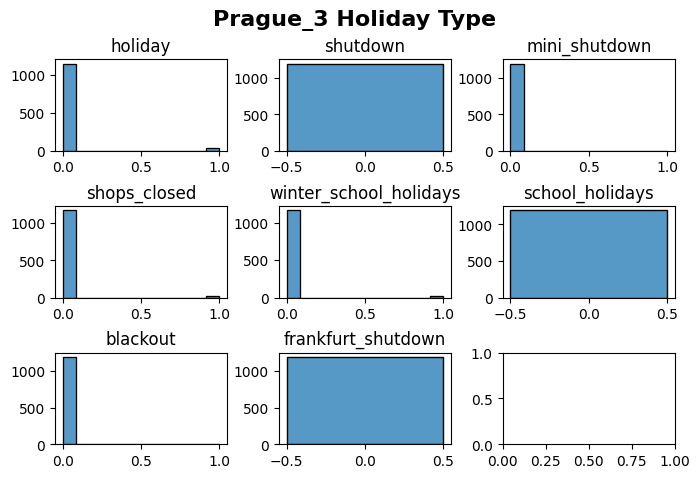

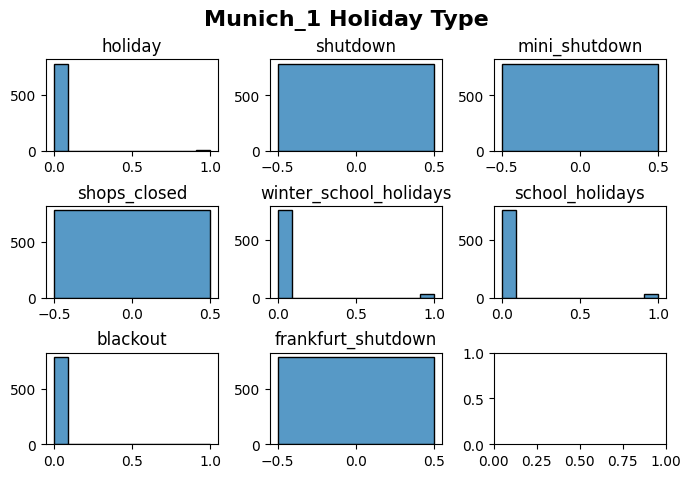

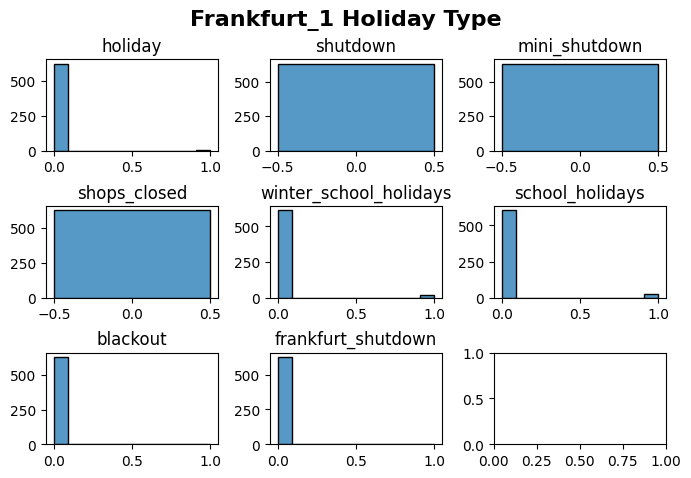

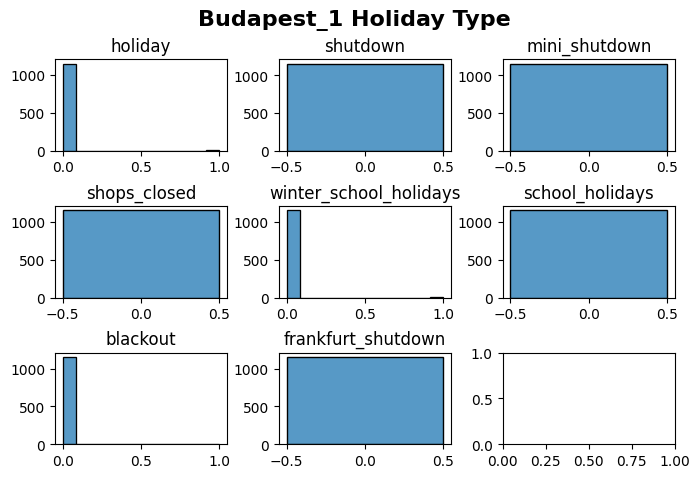

In [35]:
for warehouse in train_orders_data['warehouse'].unique():
  fig = check_binary_distributions(train_orders_data[train_orders_data['warehouse'] == warehouse  ])
  fig.suptitle(f'{warehouse} Holiday Type', fontsize=16, fontweight='bold')
  fig.show()


## mov_change distribution

Text(0.5, 1.0, 'Minimum Order Change distribution')

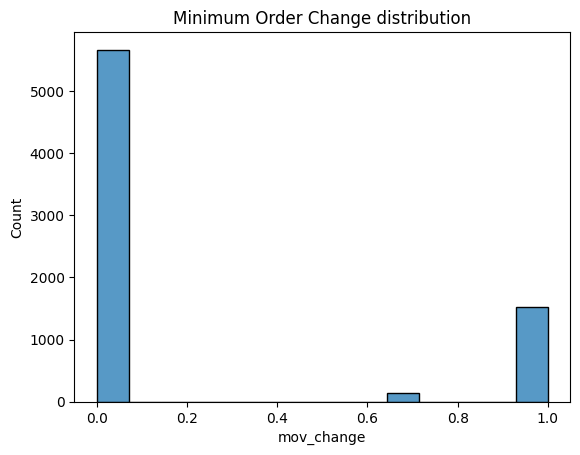

In [36]:
ax = sns.histplot(train_orders_data['mov_change'])
ax.set_title("Minimum Order Change distribution")

## mov_change distribution by warehouse

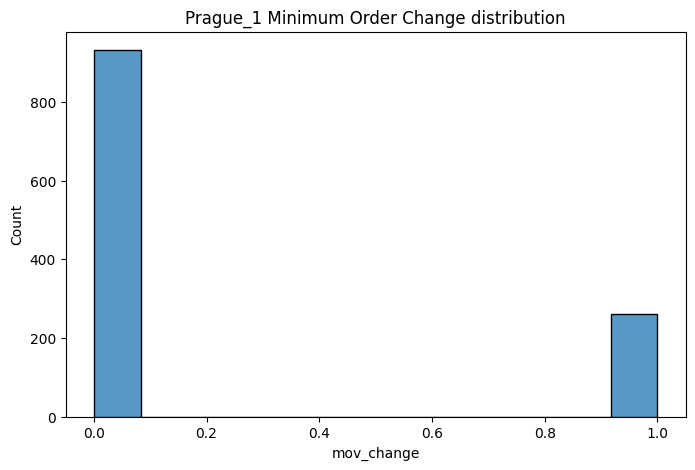

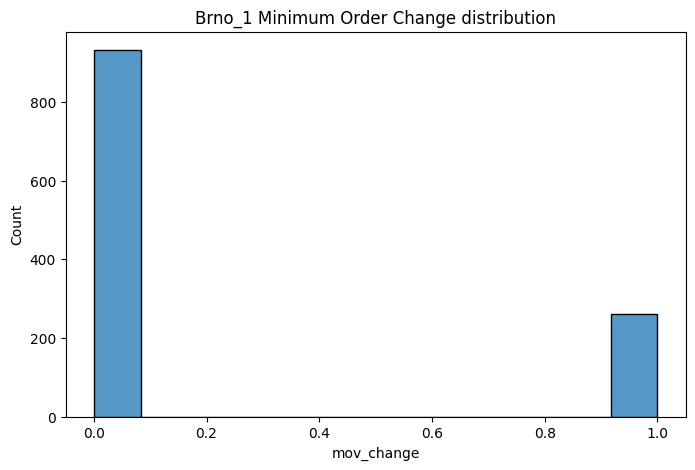

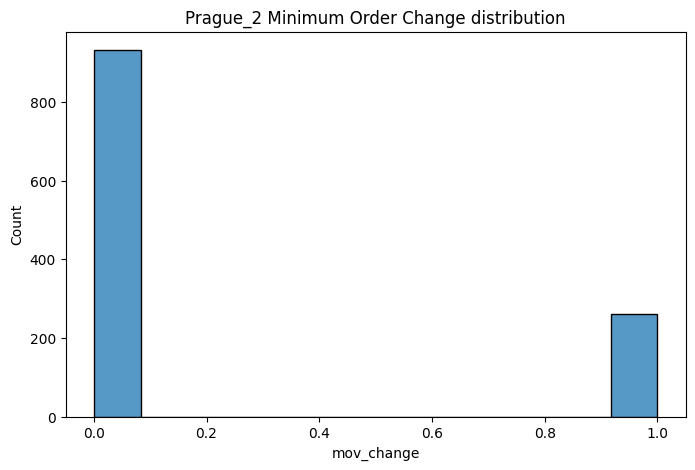

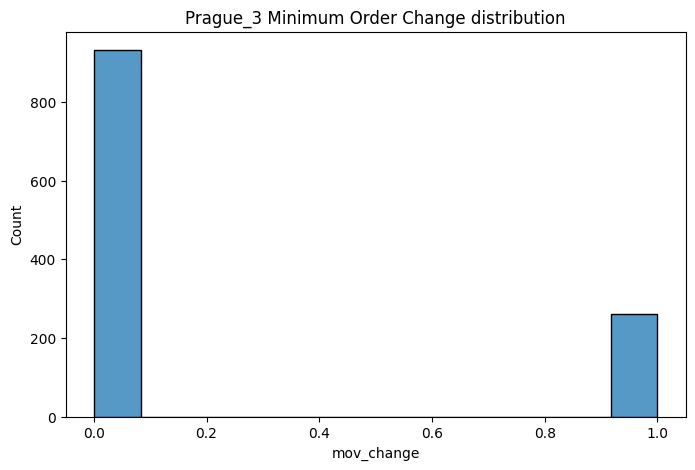

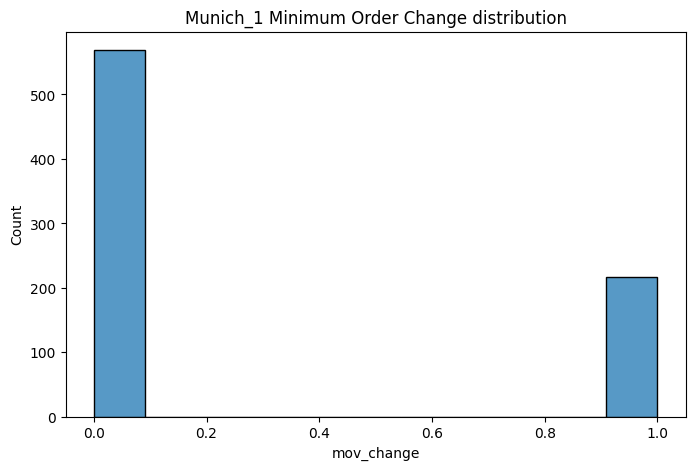

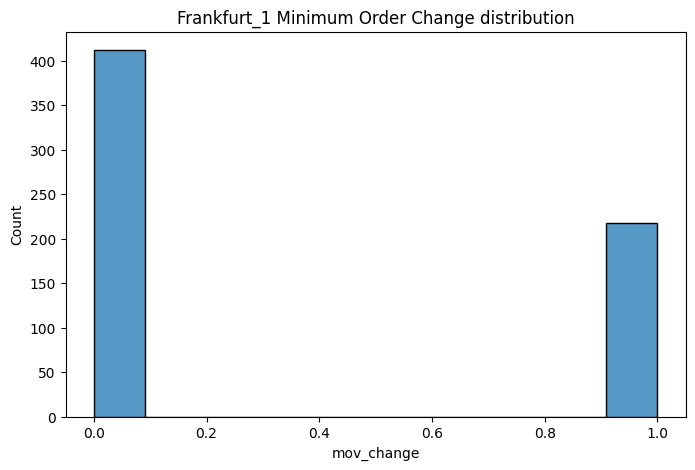

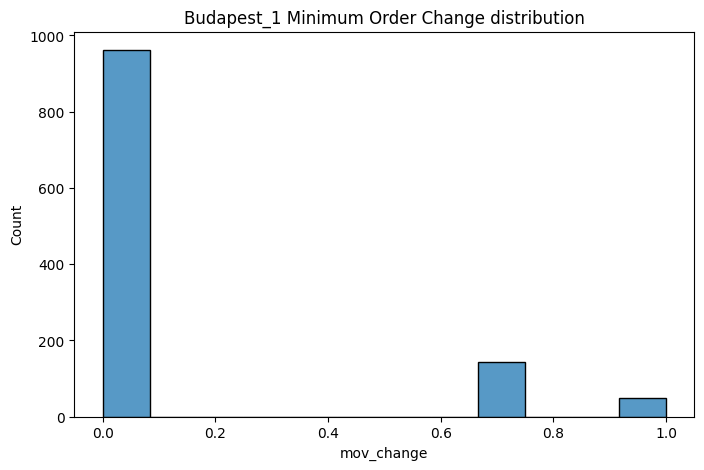

In [37]:
for warehouse in train_orders_data['warehouse'].unique():
  warehouse_subset = train_orders_data[train_orders_data["warehouse"]==warehouse]
  fig, ax = plt.subplots(figsize=(8,5))
  sns.histplot(warehouse_subset['mov_change'], ax=ax)
  ax.set_title(f"{warehouse} Minimum Order Change distribution")

## Precipitation Distribution

Text(0.5, 1.0, 'Precipitation distribution')

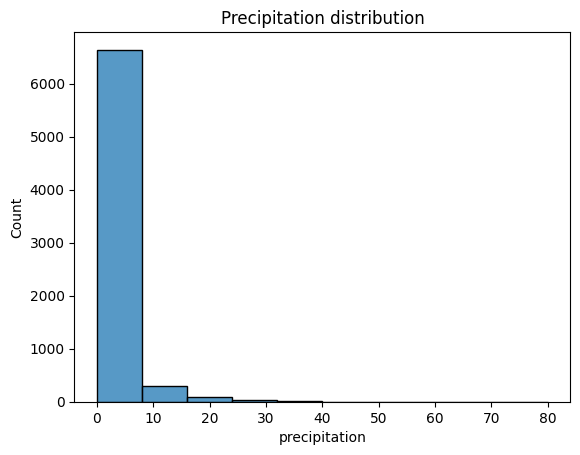

In [38]:
ax = sns.histplot(train_orders_data['precipitation'], bins=10)
ax.set_title("Precipitation distribution")

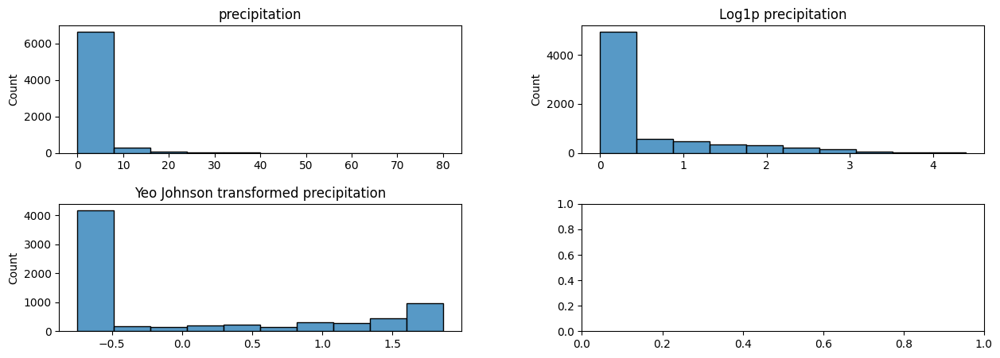

In [39]:
yeo_johnson_transformer = PowerTransformer(method='yeo-johnson')
boxcox_transformer = PowerTransformer(method='box-cox')

yeo_johnson_transformed = yeo_johnson_transformer.fit_transform(train_orders_data['precipitation'].to_numpy().reshape(-1, 1)).squeeze()
#boxcox_transformed = boxcox_transformer.fit_transform(train_orders_data['precipitation'].to_numpy().reshape(-1, 1)).squeeze()

fig, axes = plt.subplots(2, 2, figsize=(15, 5))
fig.subplots_adjust(wspace=0.3, hspace=0.4)

sns.histplot(train_orders_data['precipitation'], ax=axes[0][0], bins=10)
axes[0][0].set_title("precipitation")
axes[0][0].set_xlabel("")

sns.histplot(np.log1p(train_orders_data['precipitation']), ax=axes[0][1], bins=10)
axes[0][1].set_title("Log1p precipitation")
axes[0][1].set_xlabel("")

sns.histplot(yeo_johnson_transformed, ax=axes[1][0], bins=10)
axes[1][0].set_title("Yeo Johnson transformed precipitation")
axes[0][1].set_xlabel("")

#sns.histplot(boxcox_transformed, ax=axes[1][1])
#axes[1][1].set_title("Box-Cox transformed precipitation")
#axes[1][1].set_xlabel("")

fig.show()

## Precipitation Distribution by warehouse

Text(0.5, 1.0, 'precipitation by Warehouse')

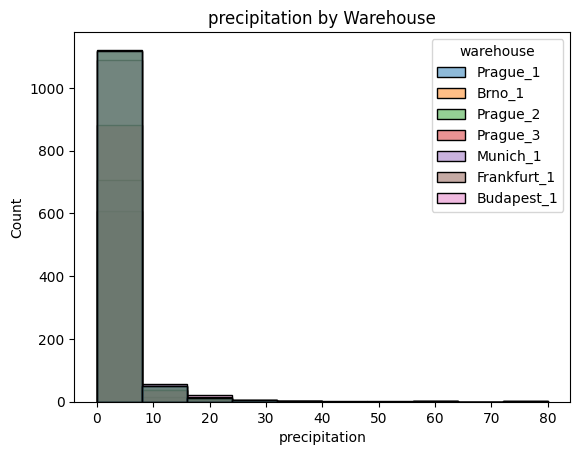

In [40]:
ax = sns.histplot(data=train_orders_data, x="precipitation", hue="warehouse", bins=10)
ax.set_title("precipitation by Warehouse")

<Axes: xlabel='precipitation'>

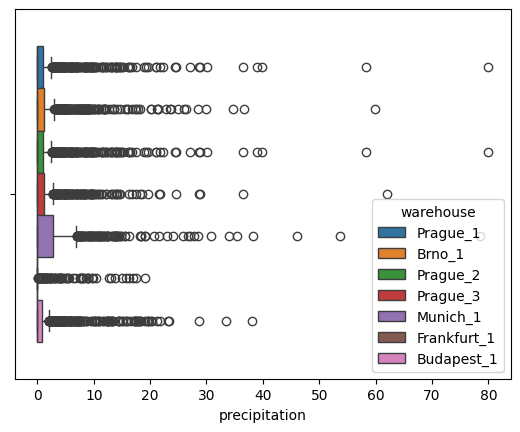

In [23]:
sns.boxplot(x="precipitation",  hue="warehouse", data=train_orders_data)

<Axes: xlabel='precipitation'>

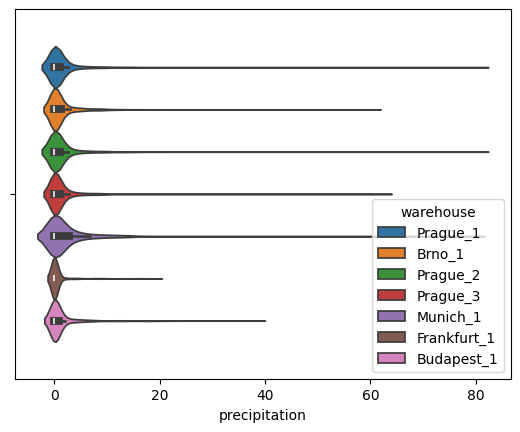

In [24]:
sns.violinplot(x="precipitation",  hue="warehouse", data=train_orders_data)

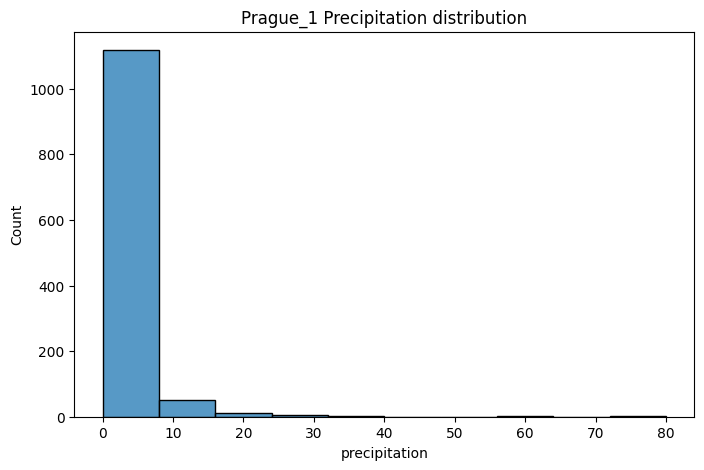

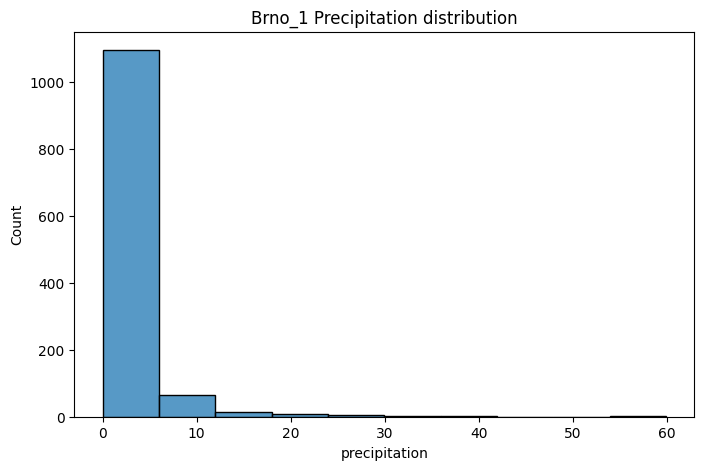

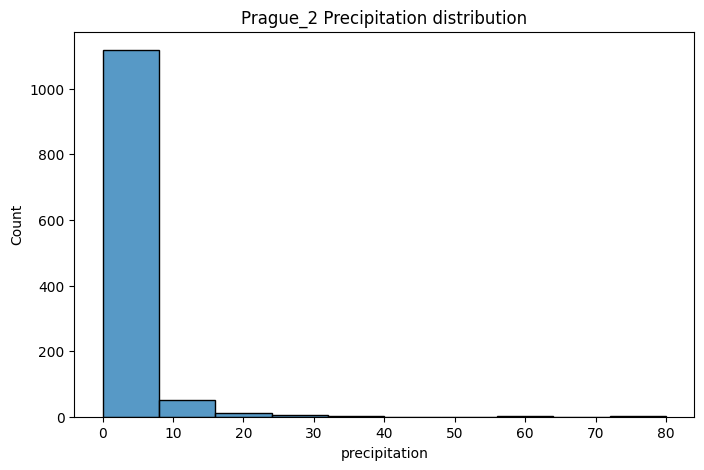

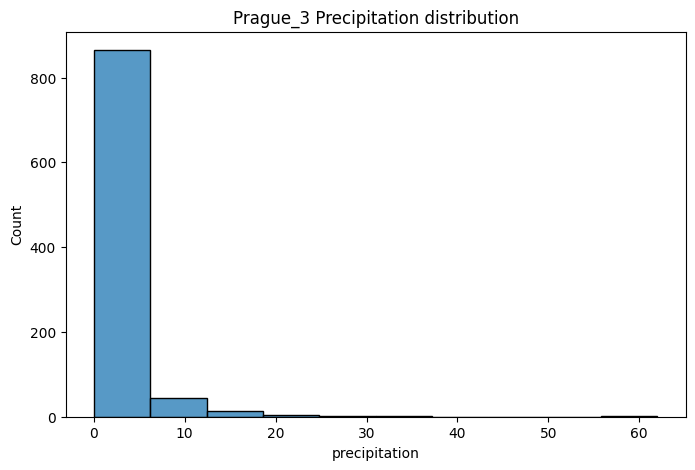

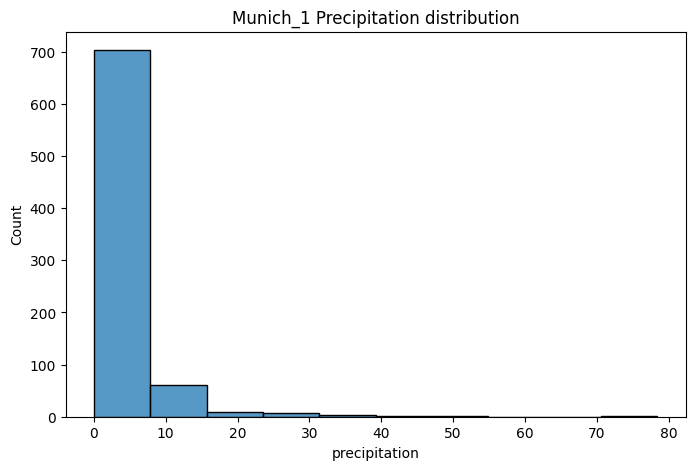

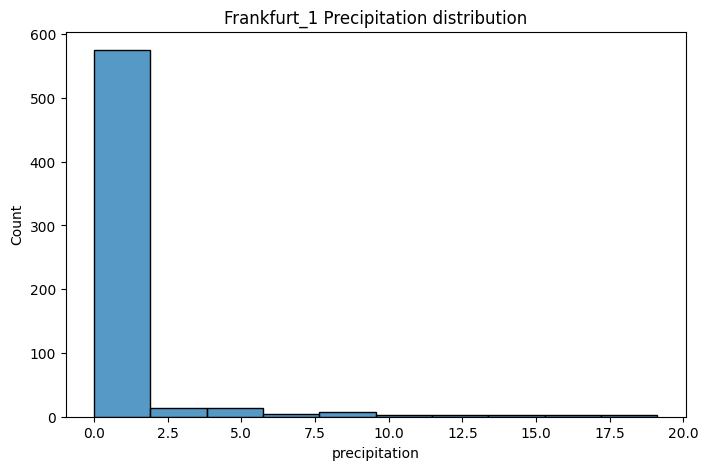

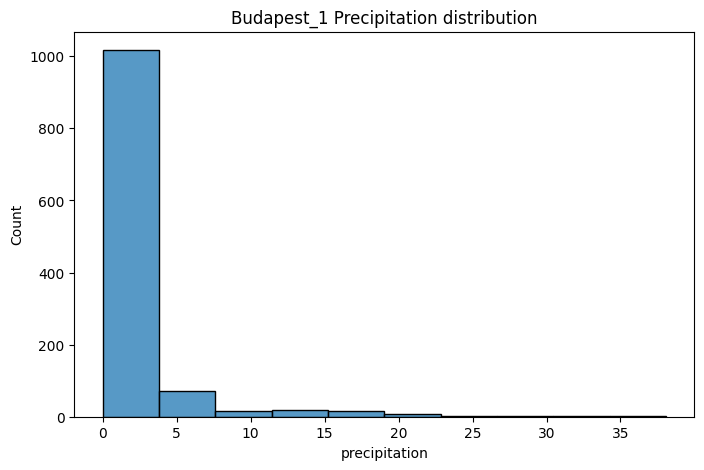

In [41]:
for warehouse in train_orders_data['warehouse'].unique():
  warehouse_subset = train_orders_data[train_orders_data["warehouse"]==warehouse]
  fig, ax = plt.subplots(figsize=(8,5))
  sns.histplot(warehouse_subset['precipitation'], bins=10, ax=ax)
  ax.set_title(f"{warehouse} Precipitation distribution")

## Snow Distribution

Text(0.5, 1.0, 'snow distribution')

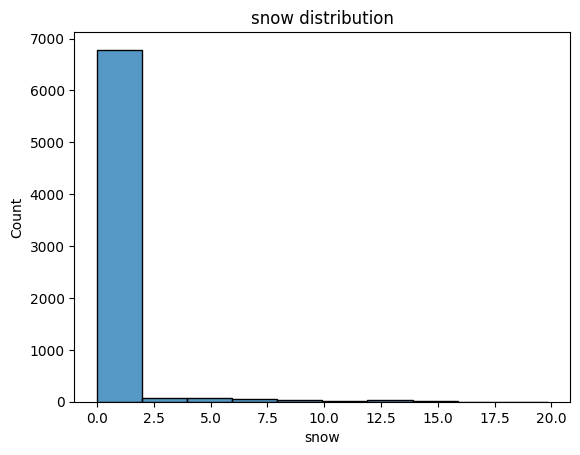

In [42]:
ax = sns.histplot(train_orders_data['snow'], bins=10)
ax.set_title("snow distribution")

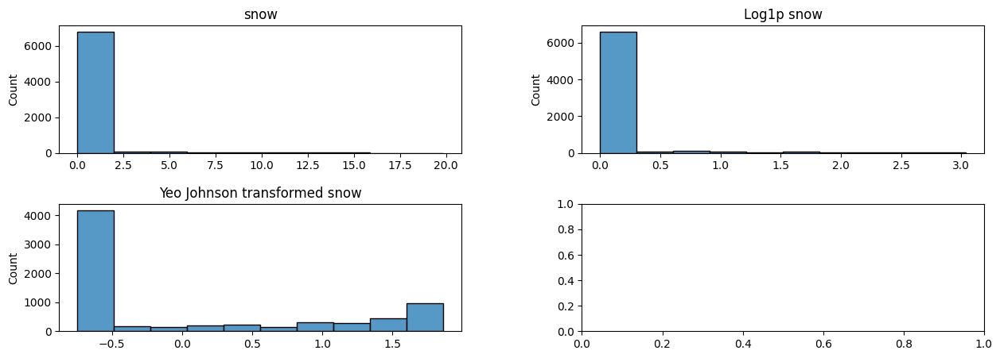

In [43]:
yeo_johnson_transformer = PowerTransformer(method='yeo-johnson')
boxcox_transformer = PowerTransformer(method='box-cox')

#yeo_johnson_transformed = yeo_johnson_transformer.fit_transform(train_orders_data['snow'].to_numpy().reshape(-1, 1)).squeeze()
#boxcox_transformed = boxcox_transformer.fit_transform(train_orders_data['snow'].to_numpy().reshape(-1, 1)).squeeze()

fig, axes = plt.subplots(2, 2, figsize=(15, 5))
fig.subplots_adjust(wspace=0.3, hspace=0.4)

sns.histplot(train_orders_data['snow'], ax=axes[0][0], bins=10)
axes[0][0].set_title("snow")
axes[0][0].set_xlabel("")

sns.histplot(np.log1p(train_orders_data['snow']), ax=axes[0][1], bins=10)
axes[0][1].set_title("Log1p snow")
axes[0][1].set_xlabel("")

sns.histplot(yeo_johnson_transformed, ax=axes[1][0], bins=10)
axes[1][0].set_title("Yeo Johnson transformed snow")
axes[0][1].set_xlabel("")

#sns.histplot(boxcox_transformed, ax=axes[1][1])
#axes[1][1].set_title("Box-Cox transformed snow")
#axes[1][1].set_xlabel("")

fig.show()

## Snow Distribution by Warehouse

Text(0.5, 1.0, 'Snow by Warehouse')

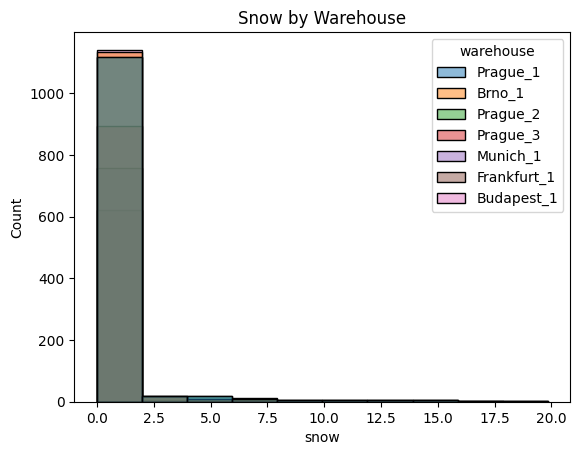

In [44]:
ax = sns.histplot(data=train_orders_data, x="snow", hue="warehouse", bins=10)
ax.set_title("Snow by Warehouse")

<Axes: xlabel='snow'>

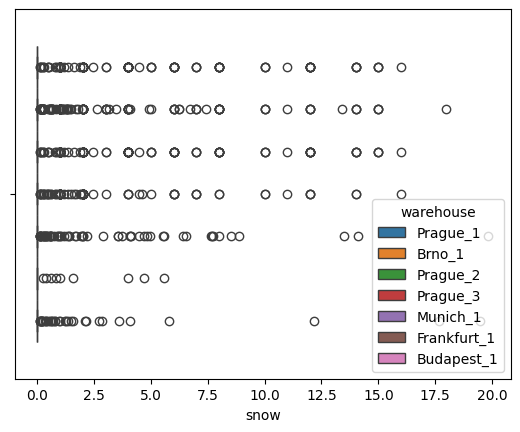

In [25]:
sns.boxplot(data=train_orders_data, x="snow", hue="warehouse")

<Axes: xlabel='snow'>

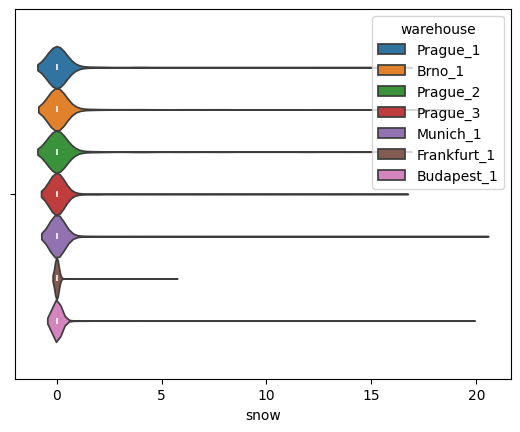

In [26]:
sns.violinplot(data=train_orders_data, x="snow", hue="warehouse")

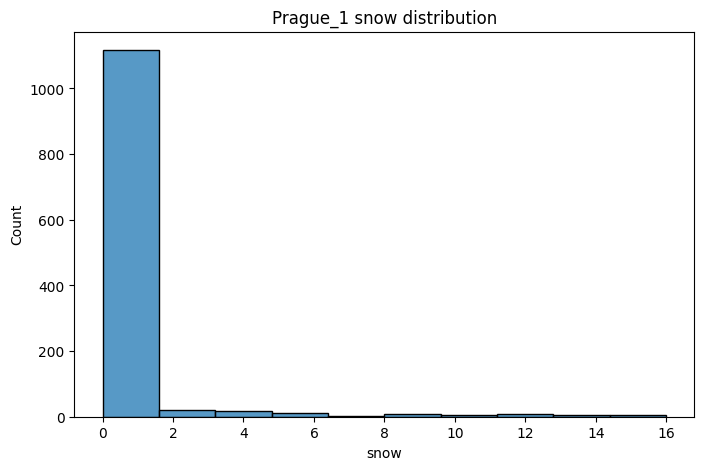

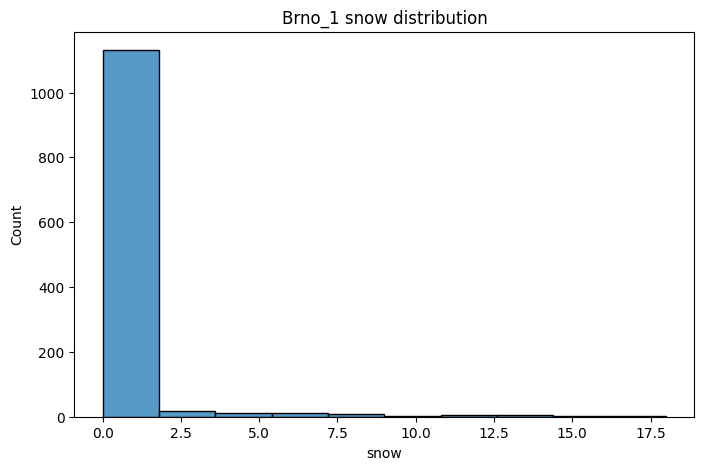

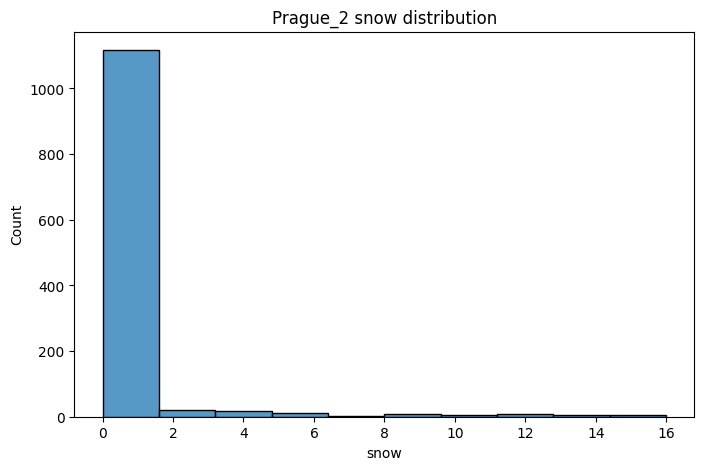

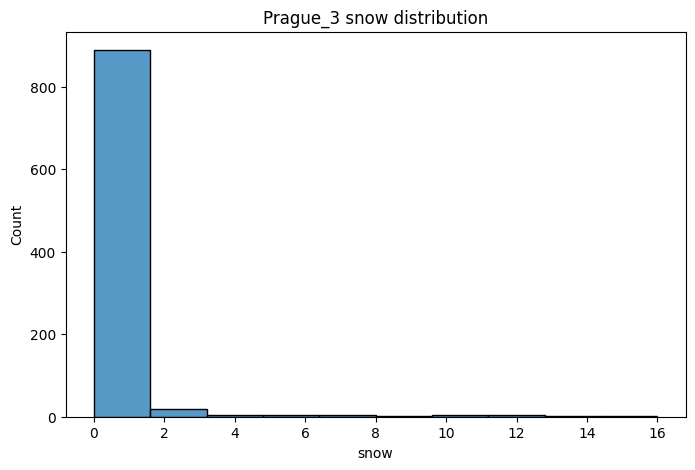

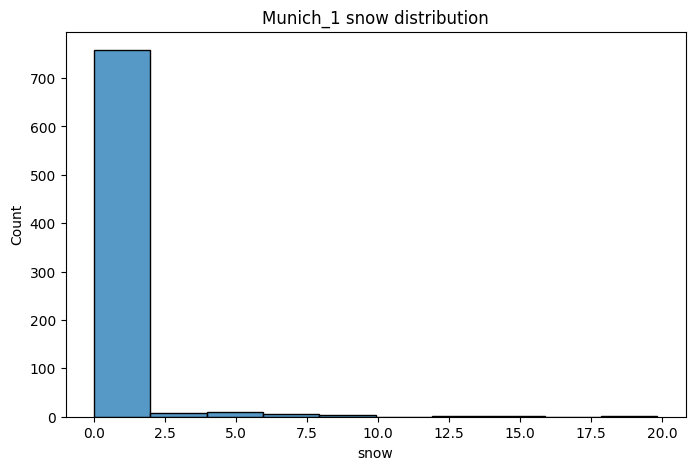

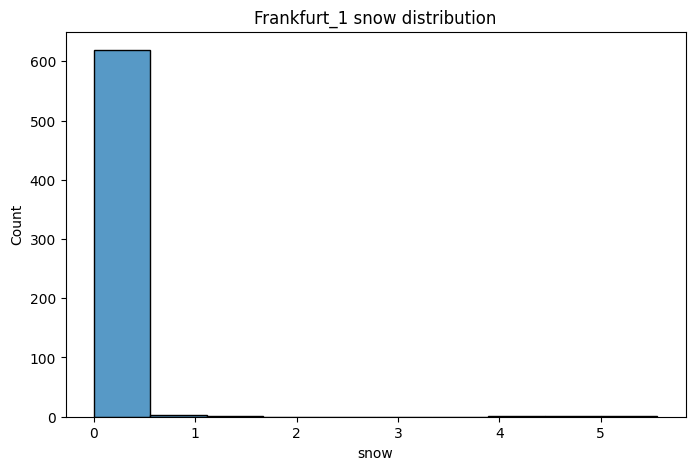

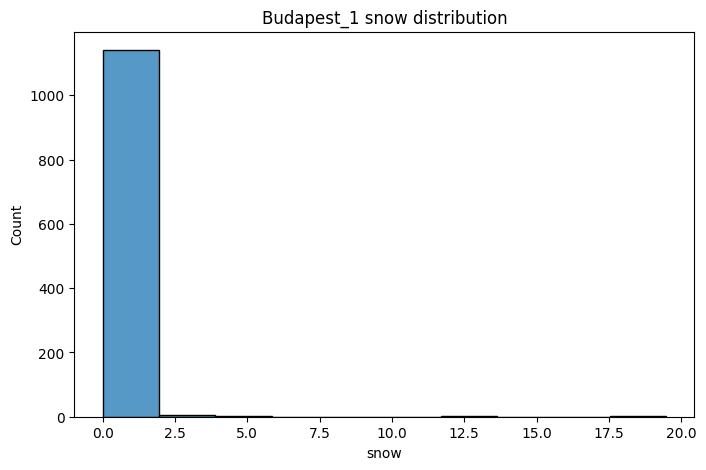

In [45]:
for warehouse in train_orders_data['warehouse'].unique():
  warehouse_subset = train_orders_data[train_orders_data["warehouse"]==warehouse]
  fig, ax = plt.subplots(figsize=(8,5))
  sns.histplot(warehouse_subset['snow'], bins=10, ax=ax)
  ax.set_title(f"{warehouse} snow distribution")

## User_activity_1 distribution

Text(0.5, 1.0, 'user_activity_1 distribution')

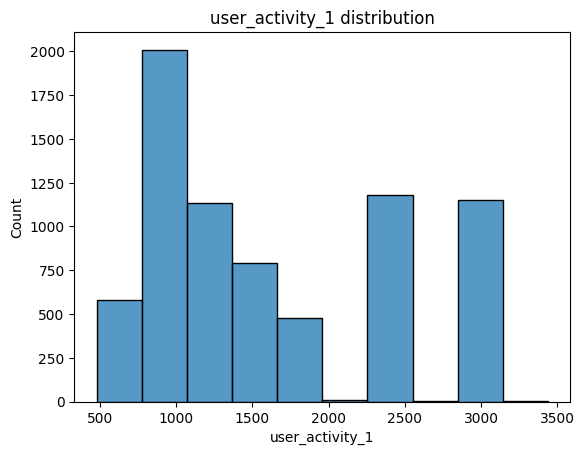

In [46]:
ax = sns.histplot(train_orders_data['user_activity_1'], bins=10)
ax.set_title("user_activity_1 distribution")

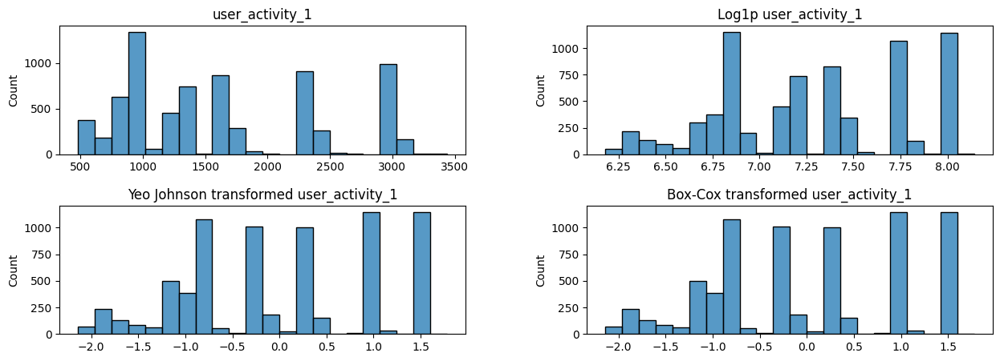

In [47]:
yeo_johnson_transformer = PowerTransformer(method='yeo-johnson')
boxcox_transformer = PowerTransformer(method='box-cox')

yeo_johnson_transformed = yeo_johnson_transformer.fit_transform(train_orders_data['user_activity_1'].to_numpy().reshape(-1, 1)).squeeze()
boxcox_transformed = boxcox_transformer.fit_transform(train_orders_data['user_activity_1'].to_numpy().reshape(-1, 1)).squeeze()

fig, axes = plt.subplots(2, 2, figsize=(15, 5))
fig.subplots_adjust(wspace=0.3, hspace=0.4)

sns.histplot(train_orders_data['user_activity_1'], ax=axes[0][0])
axes[0][0].set_title("user_activity_1")
axes[0][0].set_xlabel("")

sns.histplot(np.log1p(train_orders_data['user_activity_1']), ax=axes[0][1])
axes[0][1].set_title("Log1p user_activity_1")
axes[0][1].set_xlabel("")

sns.histplot(yeo_johnson_transformed, ax=axes[1][0])
axes[1][0].set_title("Yeo Johnson transformed user_activity_1")
axes[0][1].set_xlabel("")

sns.histplot(boxcox_transformed, ax=axes[1][1])
axes[1][1].set_title("Box-Cox transformed user_activity_1")
axes[1][1].set_xlabel("")

fig.show()

## User_activity_1 by Warehouse

Text(0.5, 1.0, 'User Activity 1 by Warehouse')

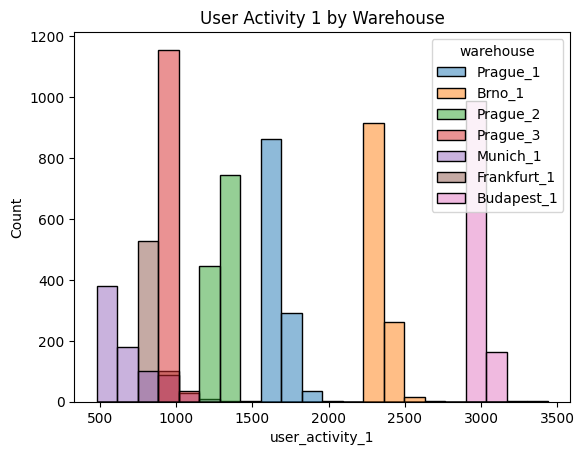

In [48]:
ax = sns.histplot(data=train_orders_data, x="user_activity_1", hue="warehouse")
ax.set_title("User Activity 1 by Warehouse")

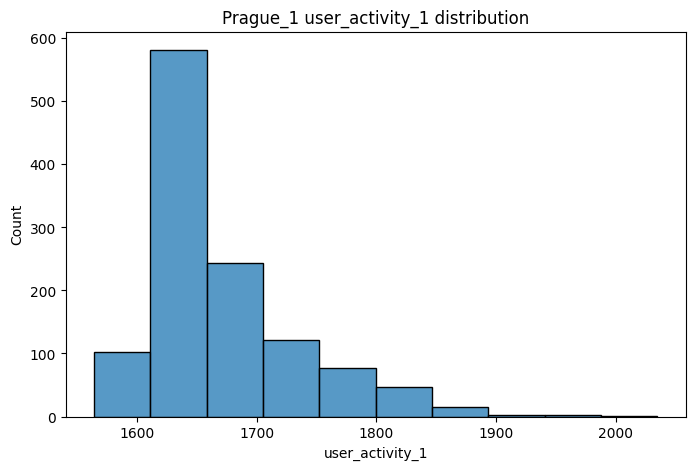

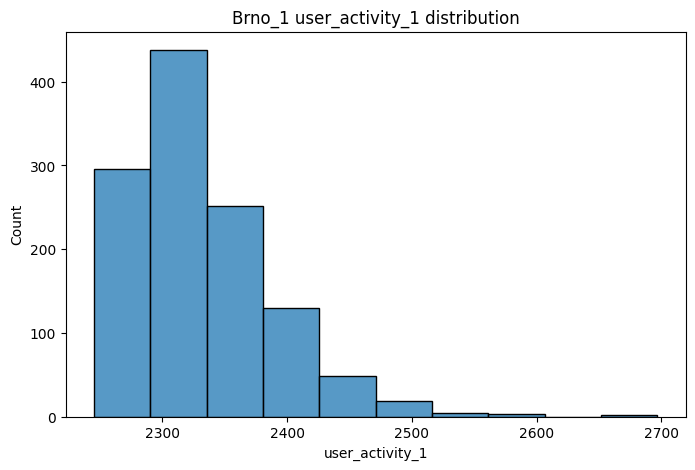

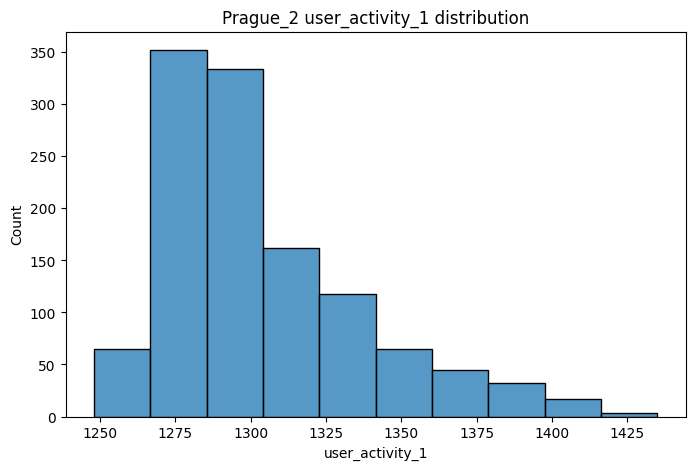

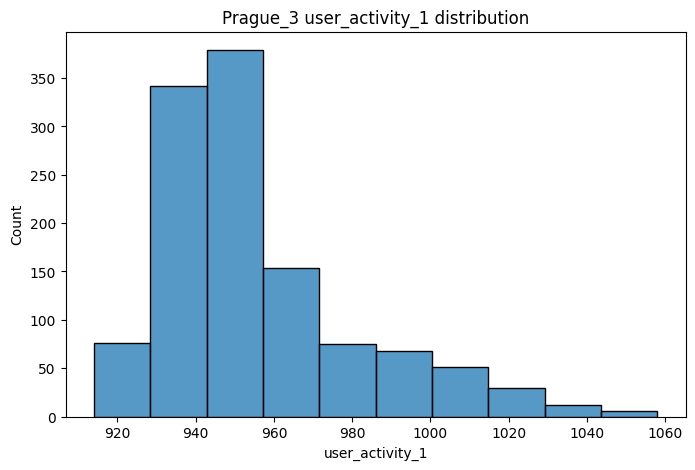

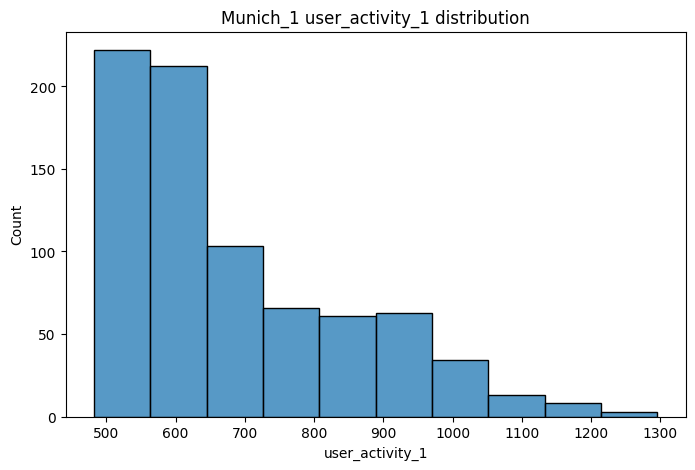

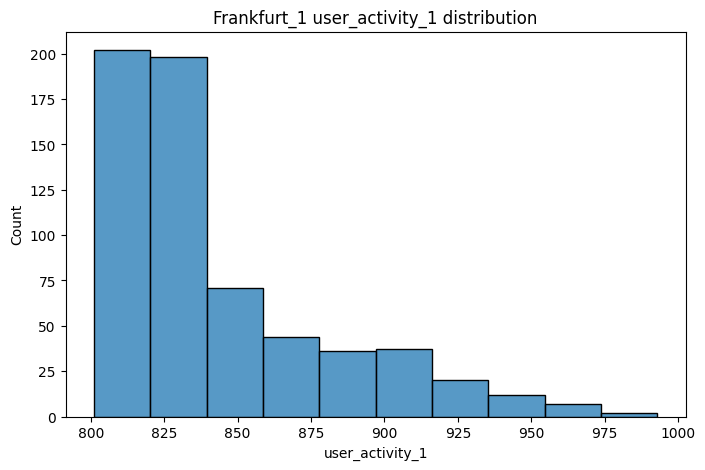

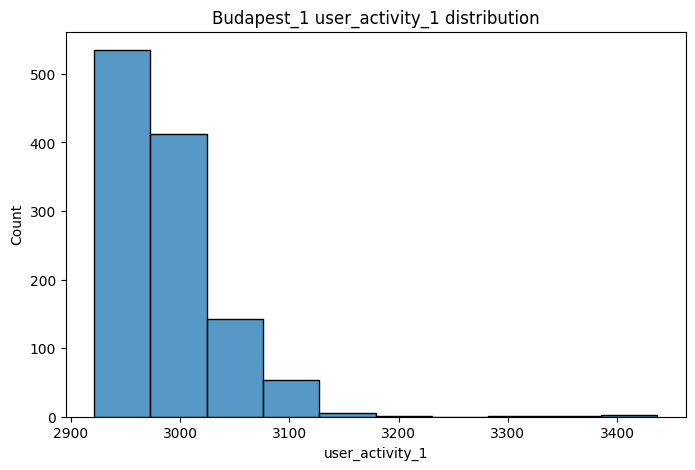

In [49]:
for warehouse in train_orders_data['warehouse'].unique():
  warehouse_subset = train_orders_data[train_orders_data["warehouse"]==warehouse]
  fig, ax = plt.subplots(figsize=(8,5))
  sns.histplot(warehouse_subset['user_activity_1'], bins=10, ax=ax)
  ax.set_title(f"{warehouse} user_activity_1 distribution")

## User_activity_2 distribution

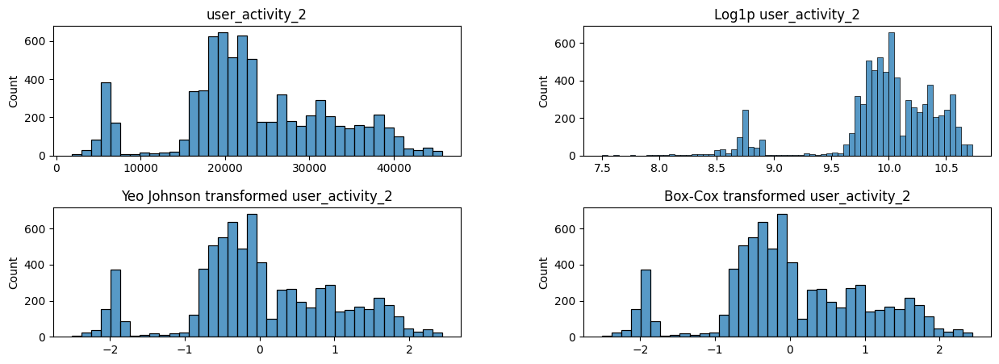

In [50]:
yeo_johnson_transformer = PowerTransformer(method='yeo-johnson')
boxcox_transformer = PowerTransformer(method='box-cox')

yeo_johnson_transformed = yeo_johnson_transformer.fit_transform(train_orders_data['user_activity_2'].to_numpy().reshape(-1, 1)).squeeze()
boxcox_transformed = boxcox_transformer.fit_transform(train_orders_data['user_activity_2'].to_numpy().reshape(-1, 1)).squeeze()

fig, axes = plt.subplots(2, 2, figsize=(15, 5))
fig.subplots_adjust(wspace=0.3, hspace=0.4)

sns.histplot(train_orders_data['user_activity_2'], ax=axes[0][0])
axes[0][0].set_title("user_activity_2")
axes[0][0].set_xlabel("")

sns.histplot(np.log1p(train_orders_data['user_activity_2']), ax=axes[0][1])
axes[0][1].set_title("Log1p user_activity_2")
axes[0][1].set_xlabel("")

sns.histplot(yeo_johnson_transformed, ax=axes[1][0])
axes[1][0].set_title("Yeo Johnson transformed user_activity_2")
axes[0][1].set_xlabel("")

sns.histplot(boxcox_transformed, ax=axes[1][1])
axes[1][1].set_title("Box-Cox transformed user_activity_2")
axes[1][1].set_xlabel("")

fig.show()

## user_activity_2 by warehouse

Text(0.5, 1.0, 'User Activity 2 by Warehouse')

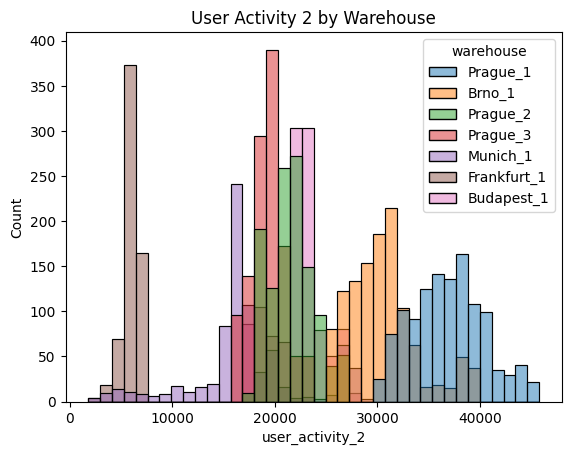

In [51]:
ax = sns.histplot(data=train_orders_data, x="user_activity_2", hue="warehouse")
ax.set_title("User Activity 2 by Warehouse")

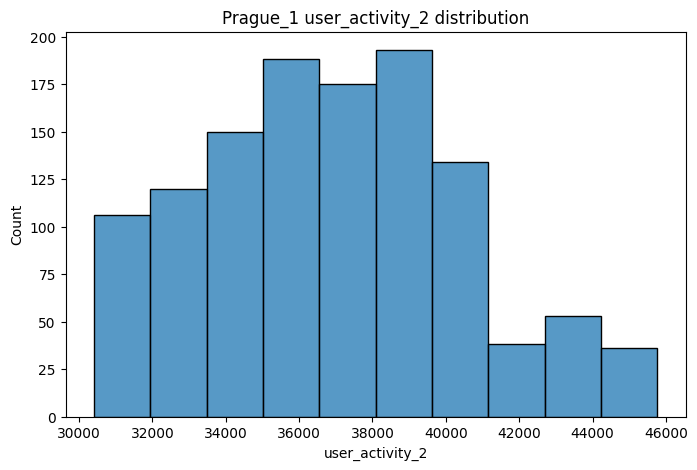

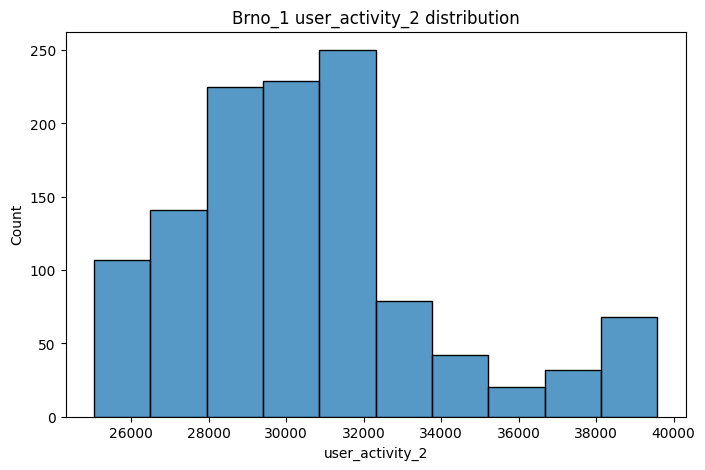

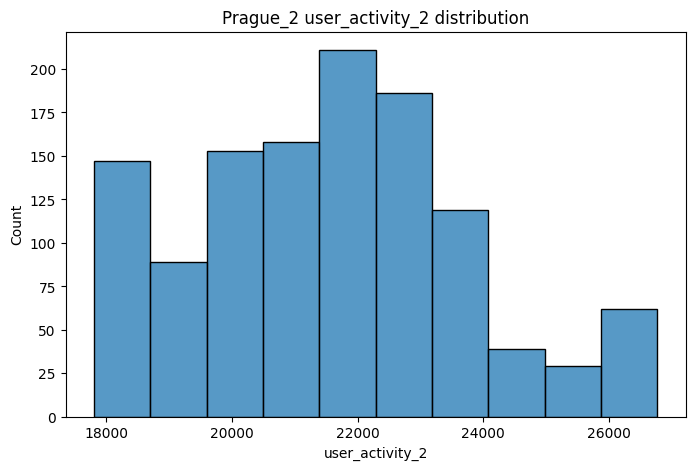

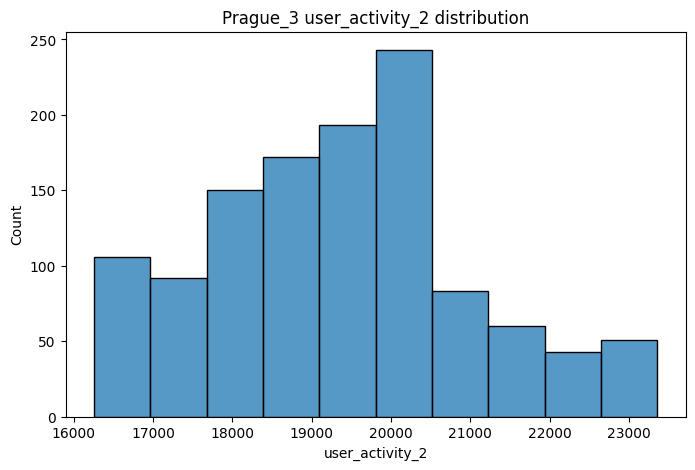

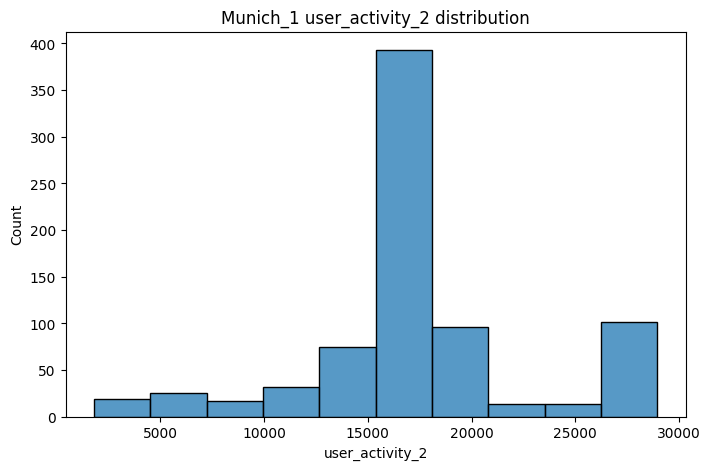

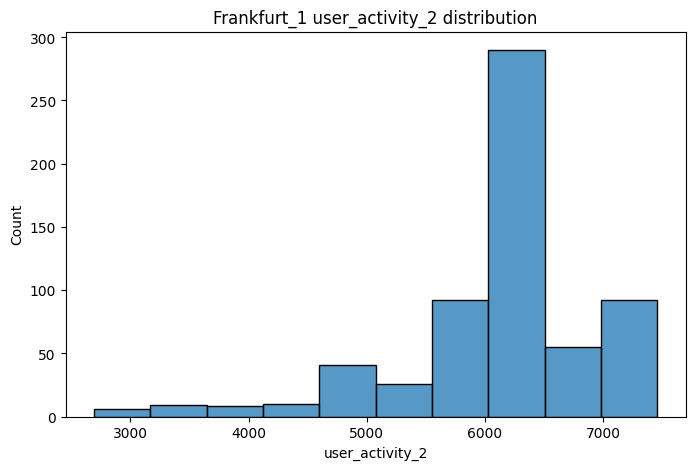

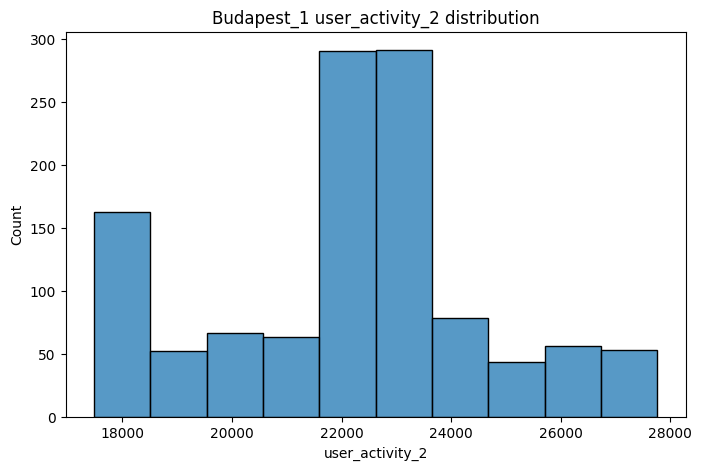

In [52]:
for warehouse in train_orders_data['warehouse'].unique():
  warehouse_subset = train_orders_data[train_orders_data["warehouse"]==warehouse]
  fig, ax = plt.subplots(figsize=(8,5))
  sns.histplot(warehouse_subset['user_activity_2'], bins=10, ax=ax)
  ax.set_title(f"{warehouse} user_activity_2 distribution")

## Total Orders line plot by Date including by Warehouse

Text(0.5, 1.0, 'Orders over Time')

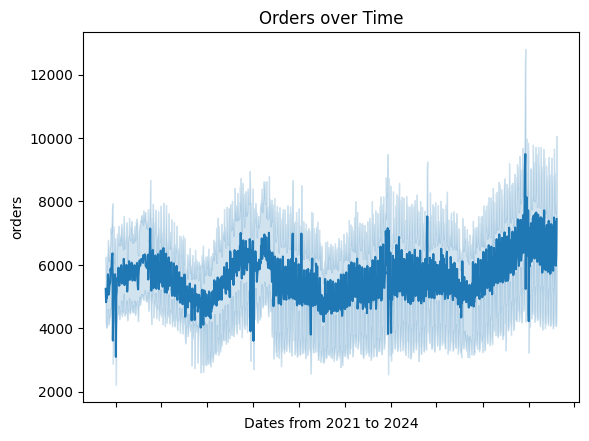

In [53]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
train_orders_data = train_orders_data.sort_values(by="date")

ax = sns.lineplot(x='date', y='orders', data=train_orders_data)
ax.set_xticklabels("")
ax.set_xlabel("Dates from 2021 to 2024")
ax.set_title("Orders over Time")

Text(0.5, 1.0, 'Subset of Orders over Time')

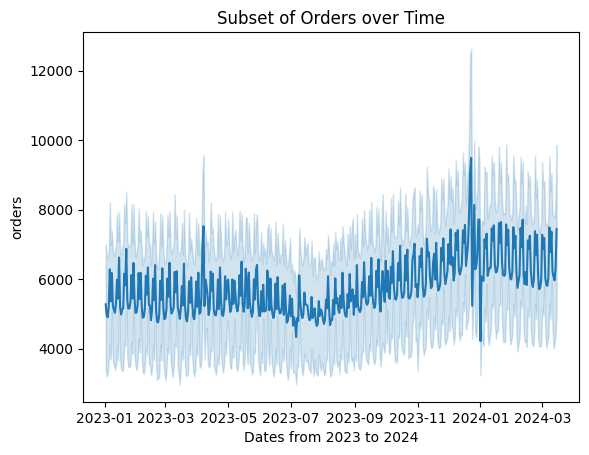

In [54]:
ax = sns.lineplot(x='date', y='orders', data=train_orders_data[train_orders_data['date'] > datetime(2023, 1, 1, 0, 0, 0)])
#ax.set_xticklabels("")
ax.set_xlabel("Dates from 2023 to 2024")
ax.set_title("Subset of Orders over Time")

Text(0.5, 1.0, 'Orders by Date')

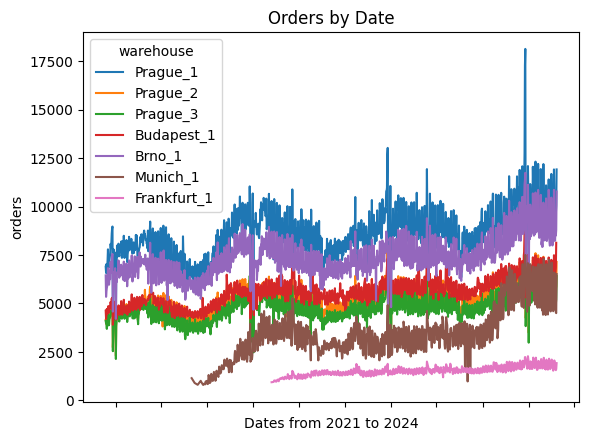

In [55]:
train_orders_data = train_orders_data.sort_values(by="date")
ax = sns.lineplot(x='date', y='orders', data=train_orders_data, hue="warehouse")
ax.set_xticklabels("")
ax.set_xlabel("Dates from 2021 to 2024")
ax.set_title("Orders by Date")

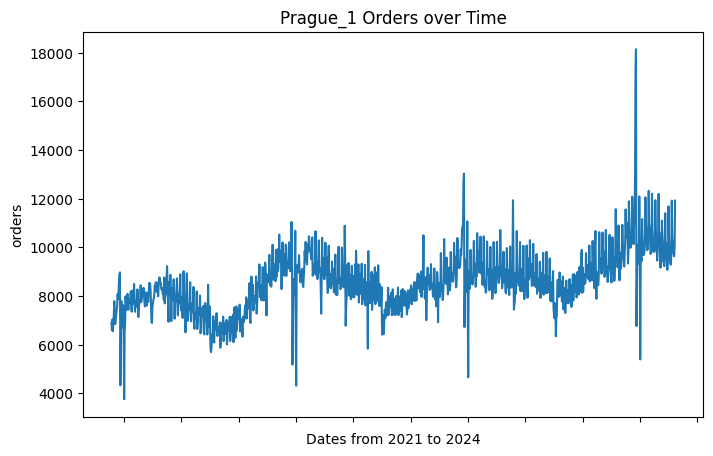

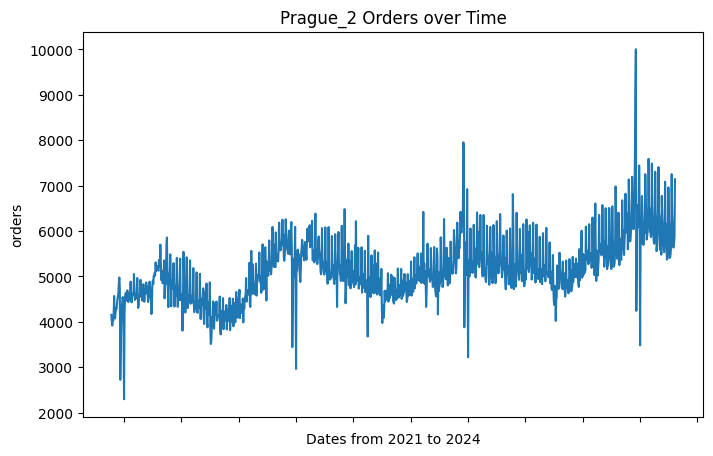

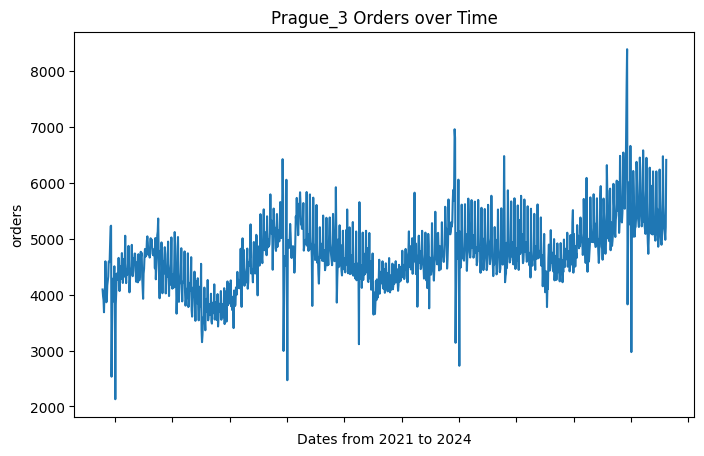

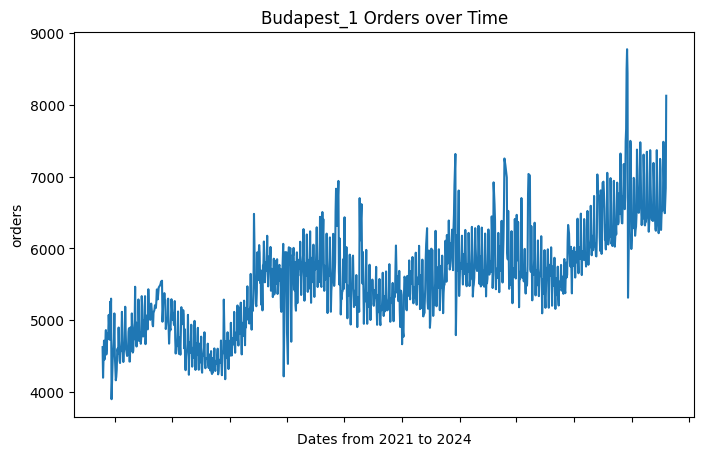

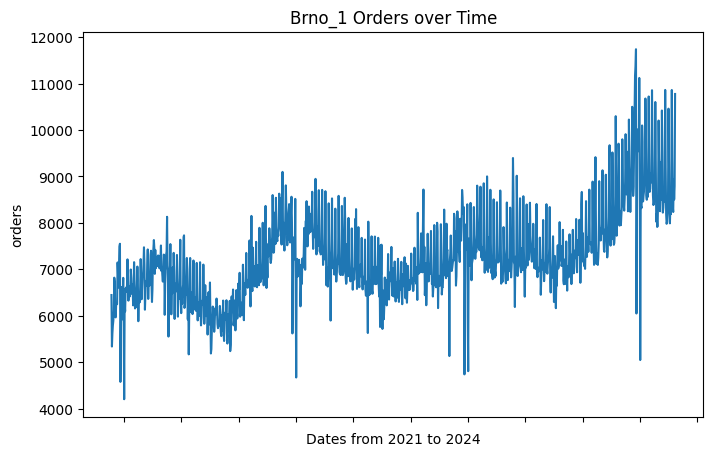

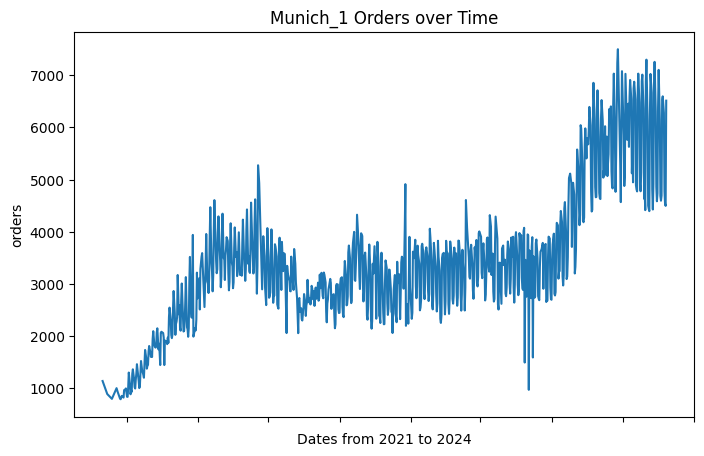

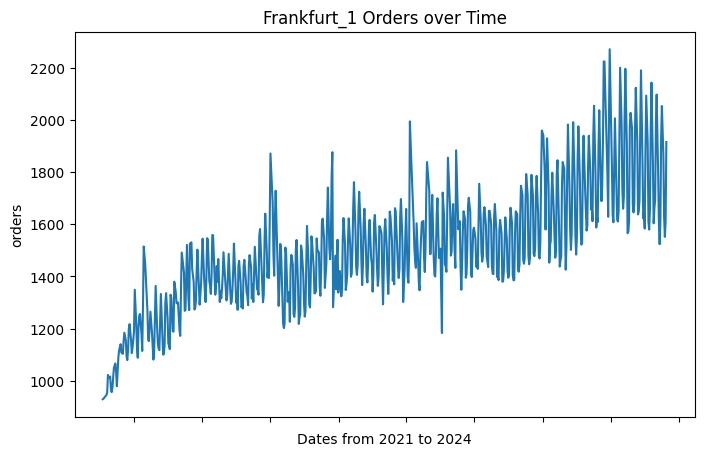

In [56]:
for warehouse in train_orders_data['warehouse'].unique():
  warehouse_subset = train_orders_data[train_orders_data["warehouse"]==warehouse].sort_values(by="date")
  fig, ax = plt.subplots(figsize=(8,5))

  ax = sns.lineplot(x='date', y='orders', data=warehouse_subset)
  ax.set_xticklabels("")
  ax.set_xlabel("Dates from 2021 to 2024")
  ax.set_title(f"{warehouse} Orders over Time")

Text(0.5, 0, 'Dates from 2023 to 2024')

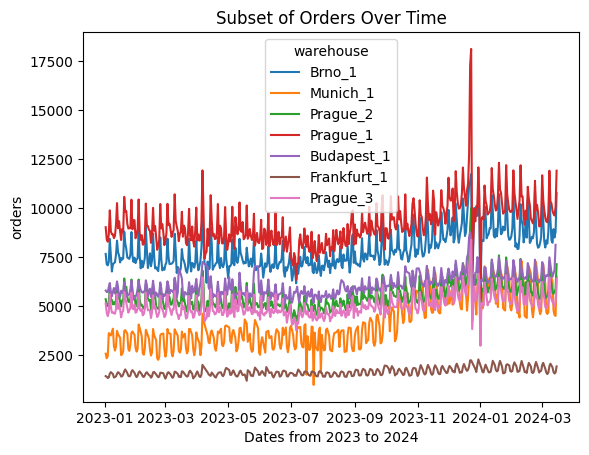

In [57]:
data_subset = train_orders_data[train_orders_data['date'] > datetime(2023, 1, 1, 0, 0, 0)].sort_values(by='date')
ax = sns.lineplot(x='date', y='orders', data=data_subset, hue="warehouse")
ax.set_title("Subset of Orders Over Time")
ax.set_xlabel("Dates from 2023 to 2024")

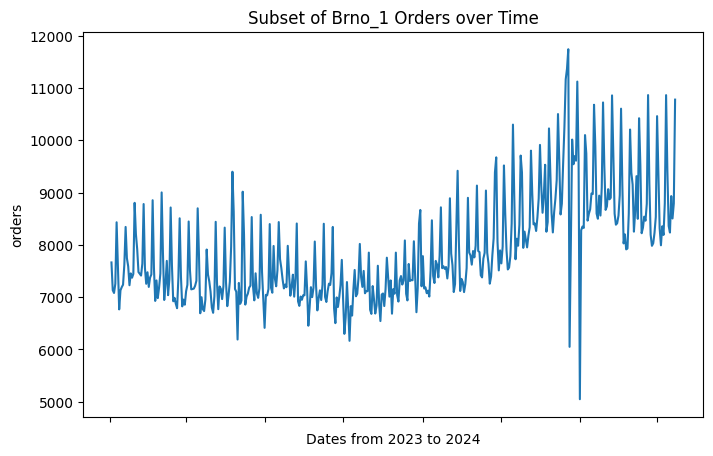

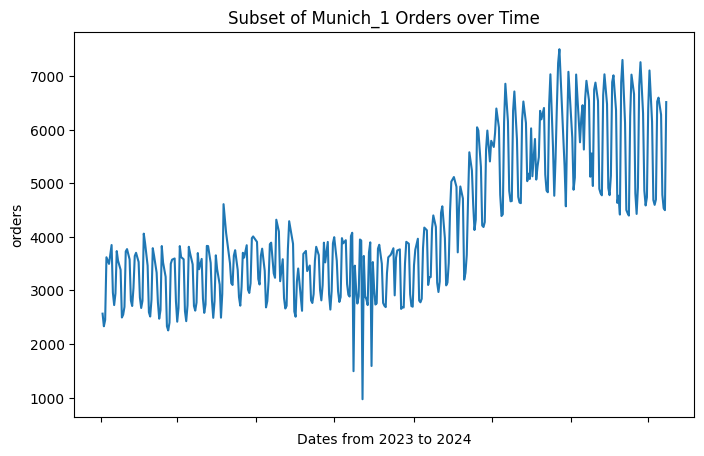

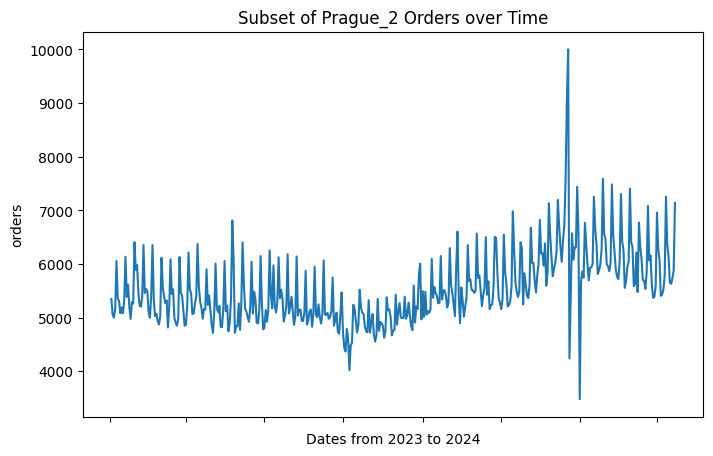

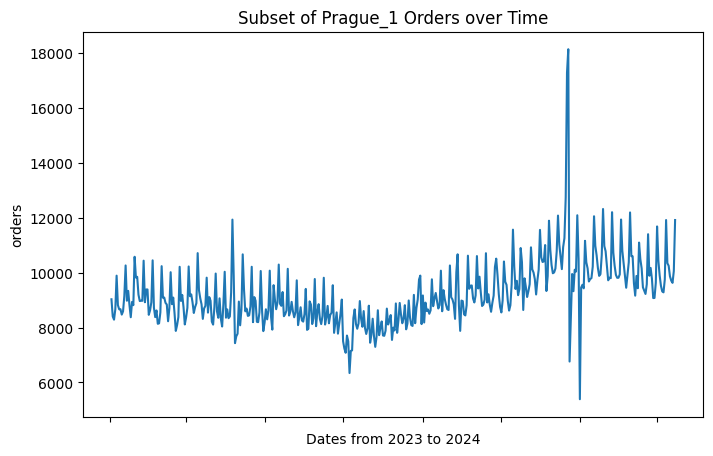

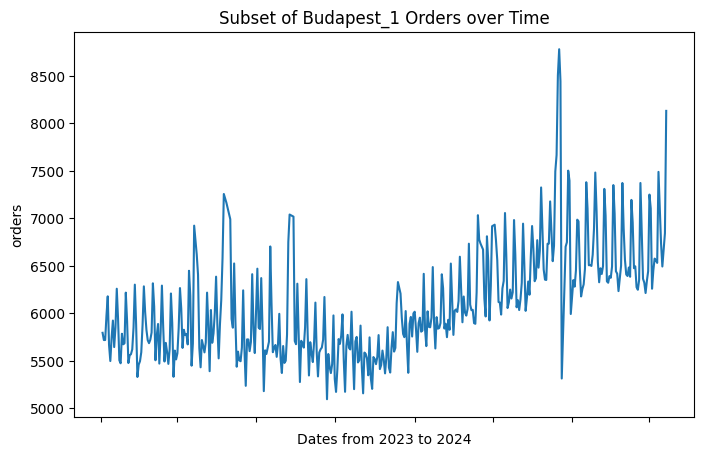

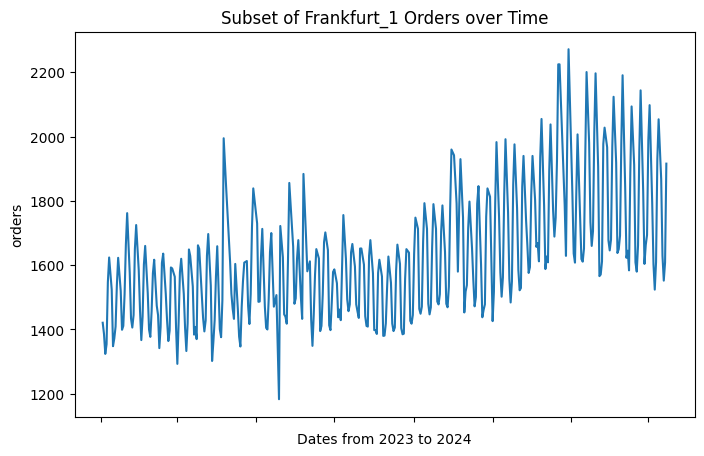

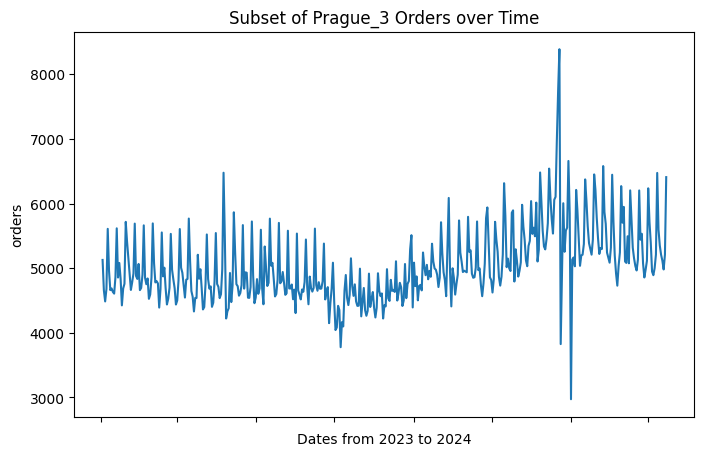

In [58]:
for warehouse in data_subset['warehouse'].unique():
  warehouse_subset = data_subset[data_subset["warehouse"]==warehouse].sort_values(by="date")
  fig, ax = plt.subplots(figsize=(8,5))

  ax = sns.lineplot(x='date', y='orders', data=warehouse_subset)
  ax.set_xticklabels("")
  ax.set_xlabel("Dates from 2023 to 2024")
  ax.set_title(f"Subset of {warehouse} Orders over Time")

## Pairwise relationships with numeric variables

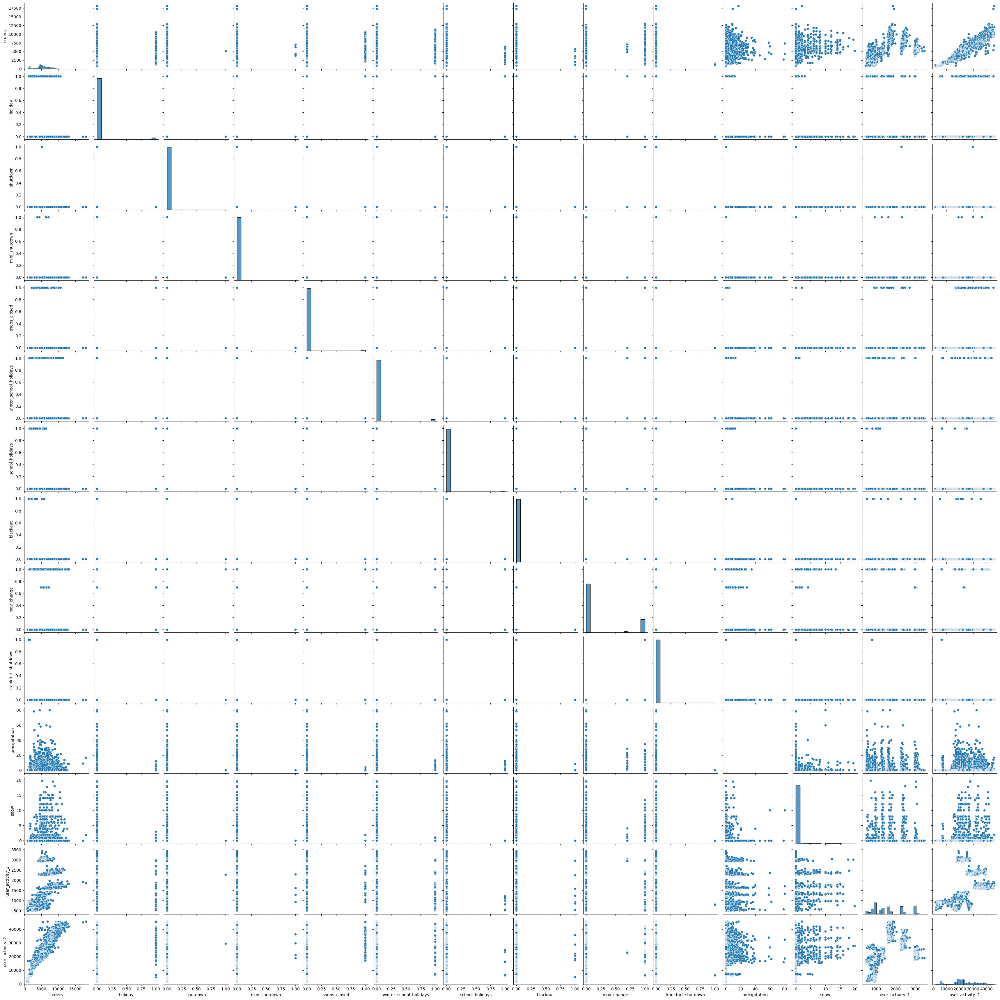

In [59]:
sns.pairplot(train_orders_data)

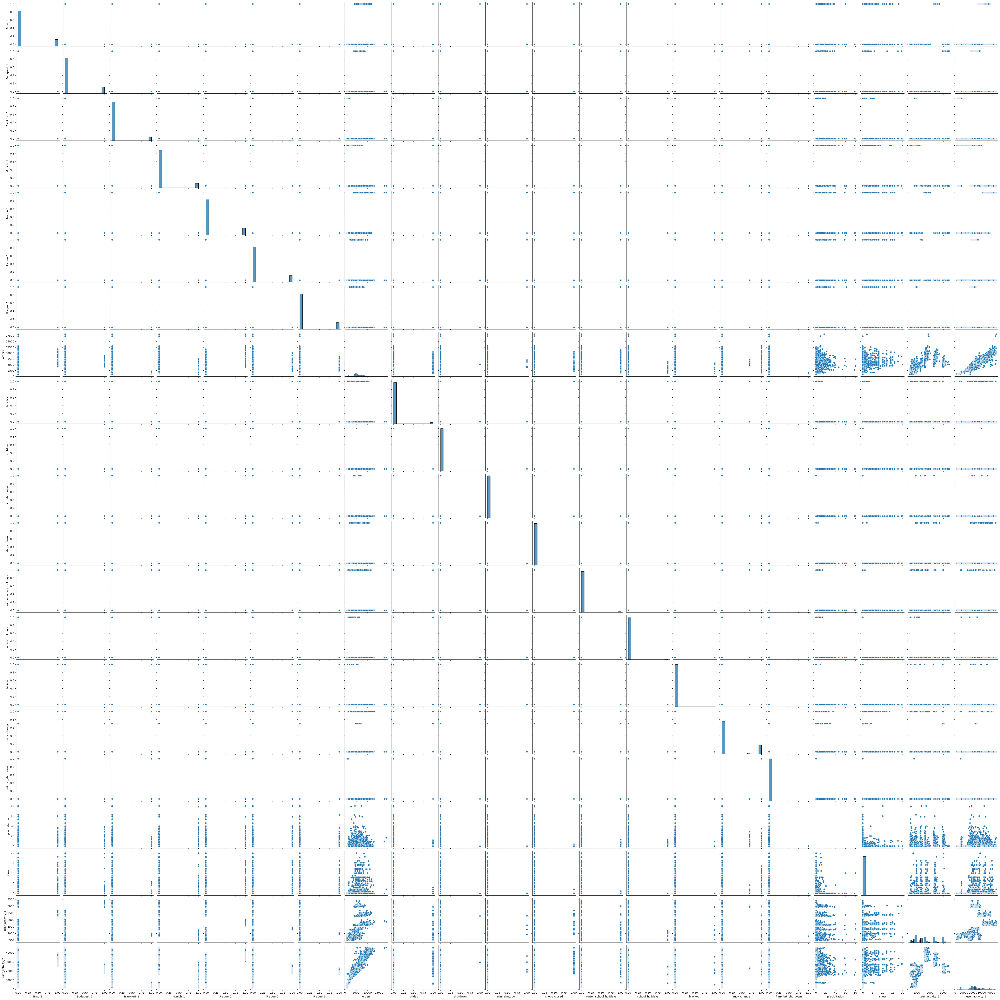

In [60]:
sns.pairplot(pd.concat((pd.get_dummies(train_orders_data['warehouse']).astype(int), train_orders_data.drop(columns=['warehouse'])), axis=1))

## Postitive relationship between orders and user_activity_2

Text(0.5, 1.0, 'Postitive relationship between orders and user_activity_2')

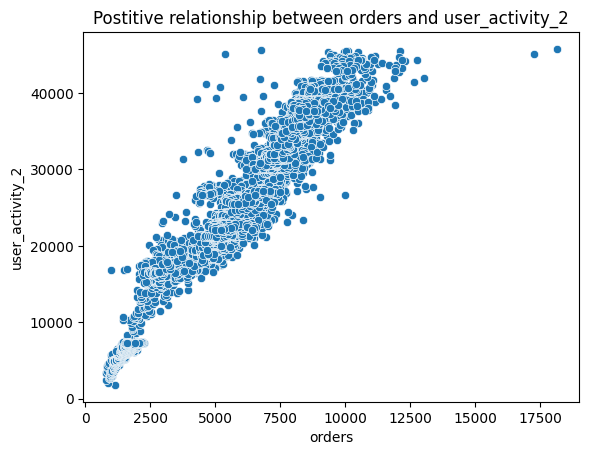

In [61]:
ax = sns.scatterplot(data=train_orders_data, x='orders', y='user_activity_2')
ax.set_title("Postitive relationship between orders and user_activity_2")

## Clusters from user_activity_1, user_activity_2, and orders variables

Text(0.5, 1.0, 'Clusters can be seen from user activity')

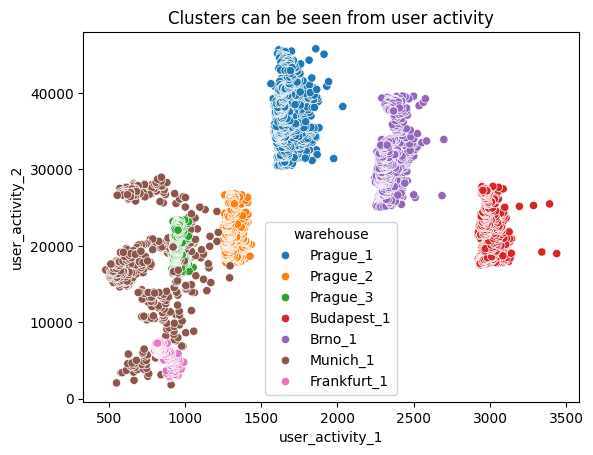

In [62]:
ax = sns.scatterplot(data=train_orders_data, x='user_activity_1', y='user_activity_2', hue="warehouse")
ax.set_title("Clusters can be seen from user activity")

Text(0.5, 1.0, 'Similar clusters appear with orders and user_activity_1')

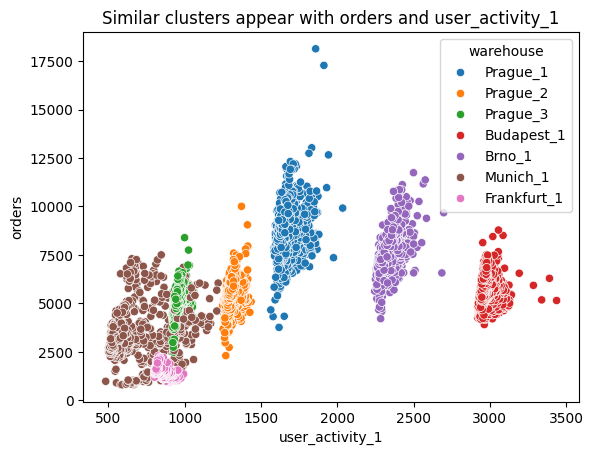

In [63]:
ax = sns.scatterplot(data=train_orders_data, x='user_activity_1', y='orders', hue="warehouse")
ax.set_title("Similar clusters appear with orders and user_activity_1")

In [64]:
ax.scatter(train_orders_data['user_activity_1'], train_orders_data['user_activity_2'], train_orders_data['orders'])

fig = px.scatter_3d(train_orders_data, x='user_activity_1', y='user_activity_2', z='orders',
              color='warehouse')
fig.show()

## Date by holiday

<Axes: xlabel='date', ylabel='holiday'>

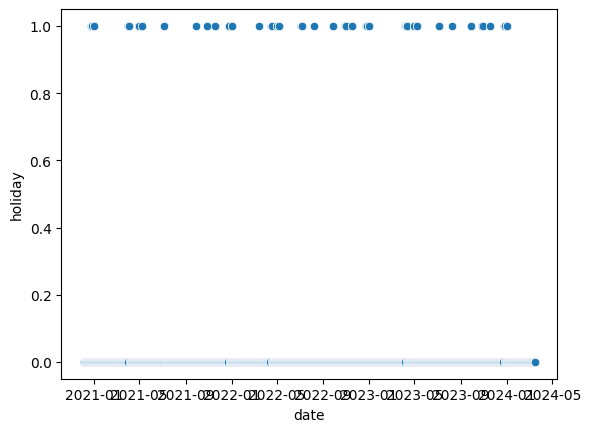

In [65]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="holiday")

<Axes: xlabel='date', ylabel='holiday'>

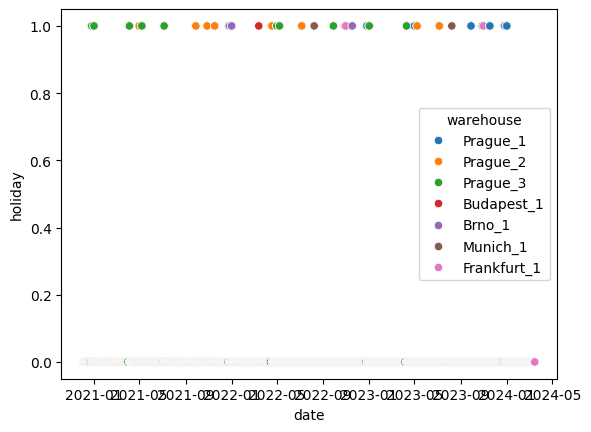

In [66]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="holiday", hue="warehouse")

In [67]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
data_2021 = train_orders_data[ (train_orders_data['date'] >=   datetime(2021, 1, 1, 0, 0, 0)) & (train_orders_data['date'] <=   datetime(2021, 12, 31, 0, 0, 0))]

<Axes: xlabel='date', ylabel='holiday'>

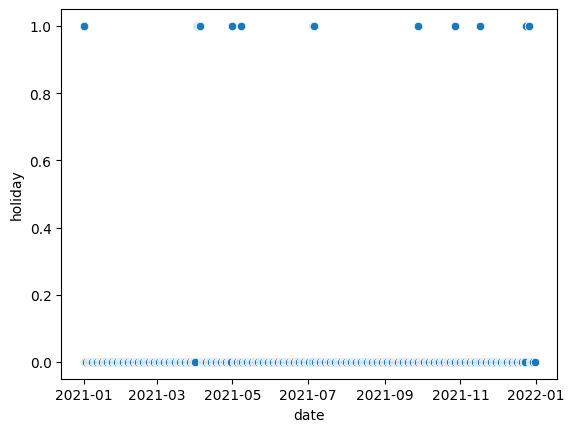

In [68]:
sns.scatterplot(data=data_2021, x="date", y="holiday")

<Axes: xlabel='date', ylabel='holiday'>

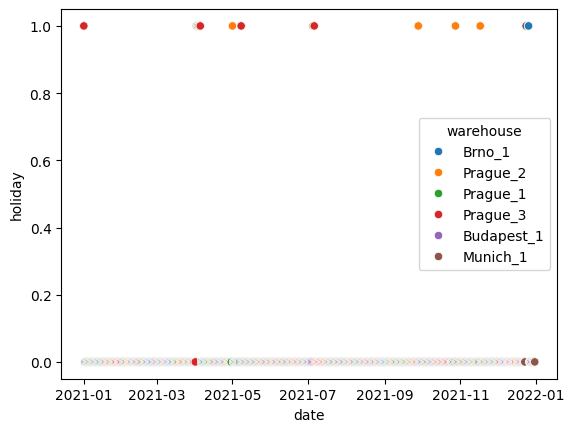

In [69]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
data_2021 = train_orders_data[ (train_orders_data['date'] >=   datetime(2021, 1, 1, 0, 0, 0)) & (train_orders_data['date'] <=   datetime(2021, 12, 31, 0, 0, 0))]
sns.scatterplot(data=data_2021, x="date", y="holiday",hue="warehouse")

## Date by shutdown

<Axes: xlabel='date', ylabel='shutdown'>

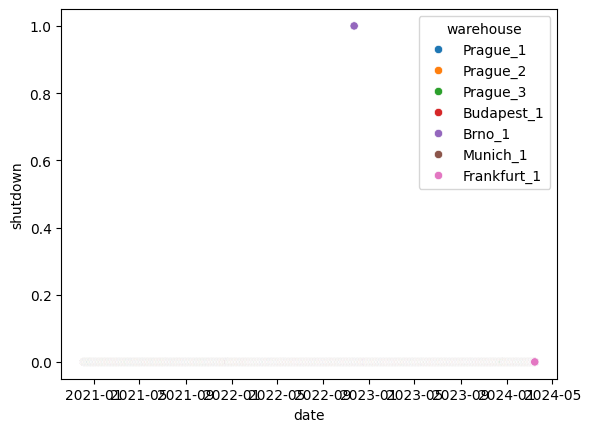

In [70]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="shutdown", hue="warehouse")

Text(0.5, 1.0, 'Date by Shutdown Zoomed In')

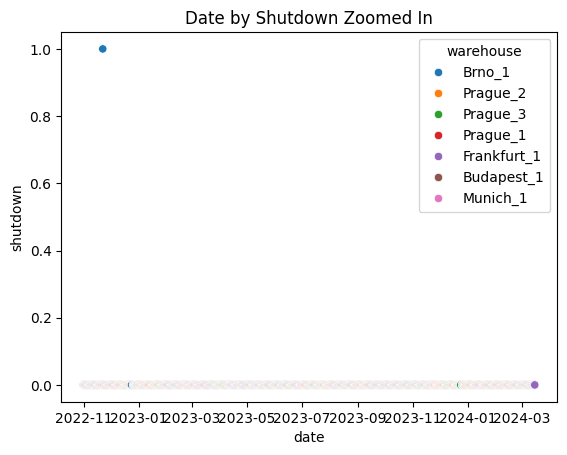

In [71]:
data_subset = train_orders_data[ (train_orders_data['date'] >=   datetime(2022, 11, 1, 0, 0, 0)) & (train_orders_data['date'] <=   datetime(2024, 12, 31, 0, 0, 0))]
ax = sns.scatterplot(data=data_subset, x="date", y="shutdown", hue="warehouse")
ax.set_title("Date by Shutdown Zoomed In")

## Date by mini-shutdown

<Axes: xlabel='date', ylabel='mini_shutdown'>

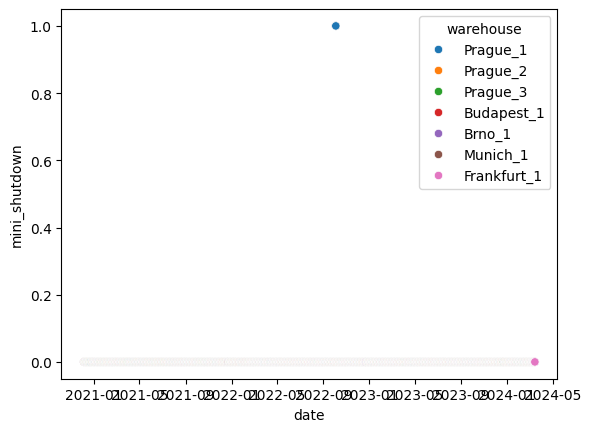

In [72]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="mini_shutdown", hue="warehouse")

Text(0.5, 1.0, 'Date by mini_shutdown Zoomed In')

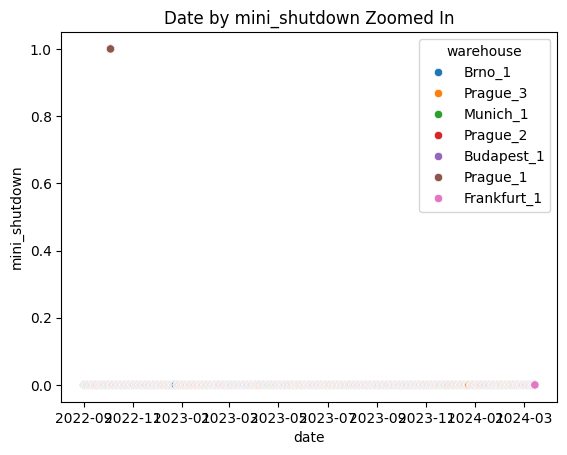

In [73]:
data_subset = train_orders_data[ (train_orders_data['date'] >=   datetime(2022, 9, 1, 0, 0, 0)) & (train_orders_data['date'] <=   datetime(2024, 12, 5, 0, 0, 0))]
ax = sns.scatterplot(data=data_subset, x="date", y="mini_shutdown", hue="warehouse")
ax.set_title("Date by mini_shutdown Zoomed In")

## Date by shops_closed

<Axes: xlabel='date', ylabel='shops_closed'>

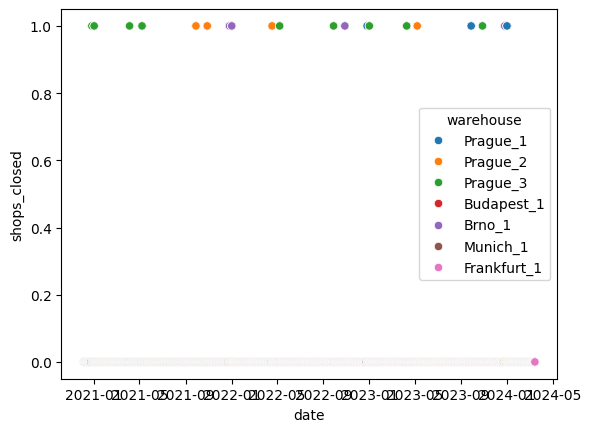

In [74]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="shops_closed", hue="warehouse")

<Axes: xlabel='date', ylabel='shops_closed'>

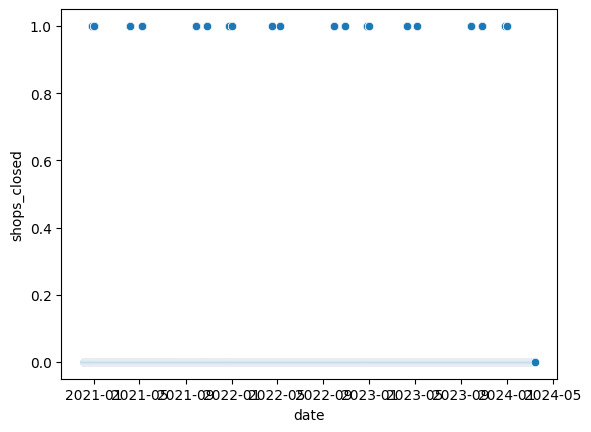

In [75]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="shops_closed")

In [76]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
data_2021 = train_orders_data[ (train_orders_data['date'] >=   datetime(2021, 1, 1, 0, 0, 0)) & (train_orders_data['date'] <=   datetime(2021, 12, 31, 0, 0, 0))]

<Axes: xlabel='date', ylabel='shops_closed'>

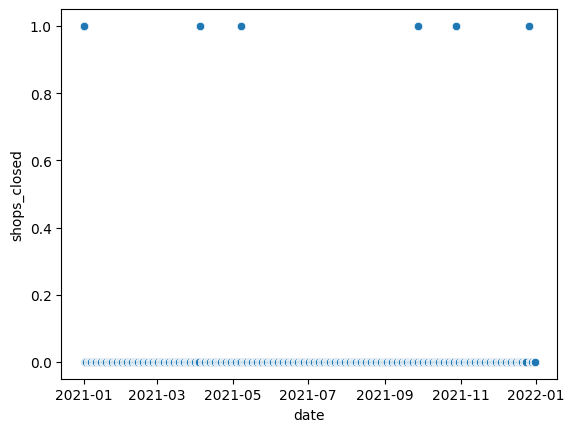

In [77]:
sns.scatterplot(data=data_2021, x="date", y="shops_closed")

<Axes: xlabel='date', ylabel='shops_closed'>

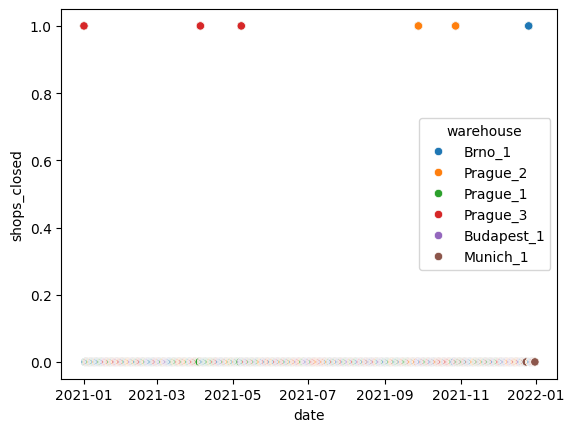

In [78]:
sns.scatterplot(data=data_2021, x="date", y="shops_closed", hue="warehouse")

## Date by winter_school_holidays

<Axes: xlabel='date', ylabel='winter_school_holidays'>

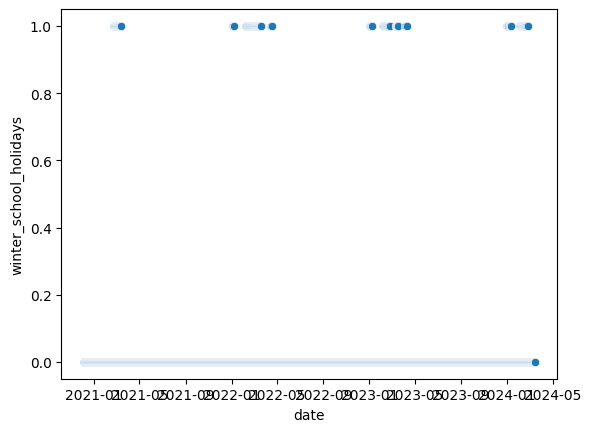

In [79]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="winter_school_holidays")

<Axes: xlabel='date', ylabel='winter_school_holidays'>

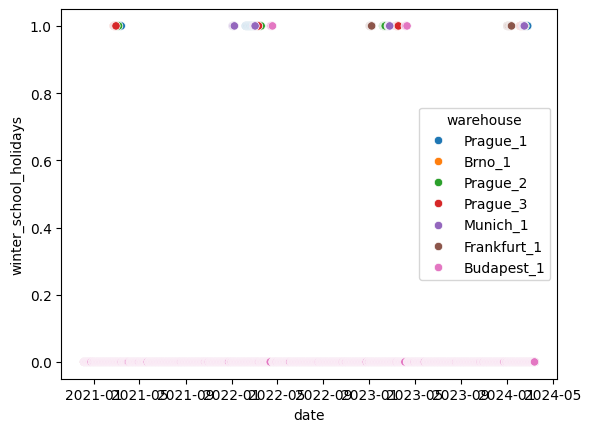

In [29]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="winter_school_holidays", hue="warehouse")

<Axes: xlabel='date', ylabel='winter_school_holidays'>

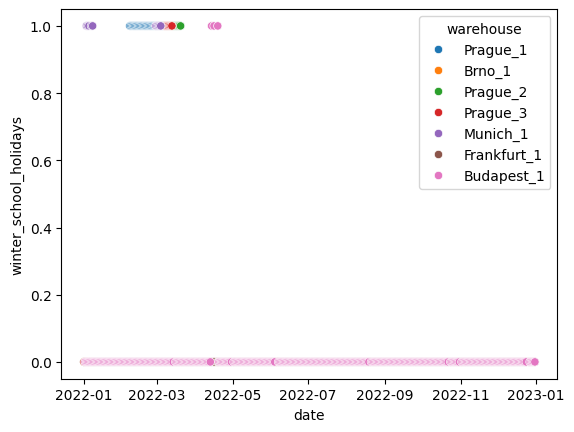

In [31]:
data_2022 = train_orders_data[ (train_orders_data['date'] >=   datetime(2022, 1, 1, 0, 0, 0)) & (train_orders_data['date'] <=   datetime(2022, 12, 31, 0, 0, 0))]
sns.scatterplot(data=data_2022, x="date", y="winter_school_holidays", hue="warehouse")

<Axes: xlabel='date', ylabel='winter_school_holidays'>

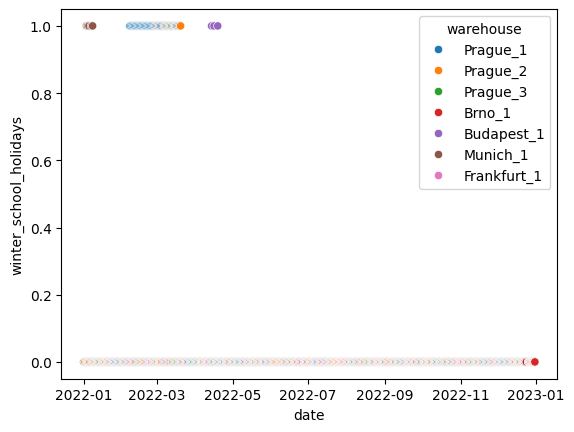

In [82]:
data_2022 = train_orders_data[ (train_orders_data['date'] >=   datetime(2022, 1, 1, 0, 0, 0)) & (train_orders_data['date'] <=   datetime(2022, 12, 31, 0, 0, 0))]
sns.scatterplot(data=data_2022, x="date", y="winter_school_holidays", hue="warehouse")

## Date by school_holidays

<Axes: xlabel='date', ylabel='school_holidays'>

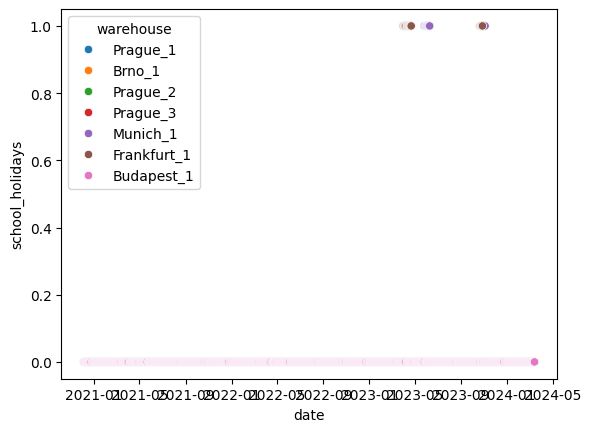

In [32]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="school_holidays", hue="warehouse")

<Axes: xlabel='date', ylabel='school_holidays'>

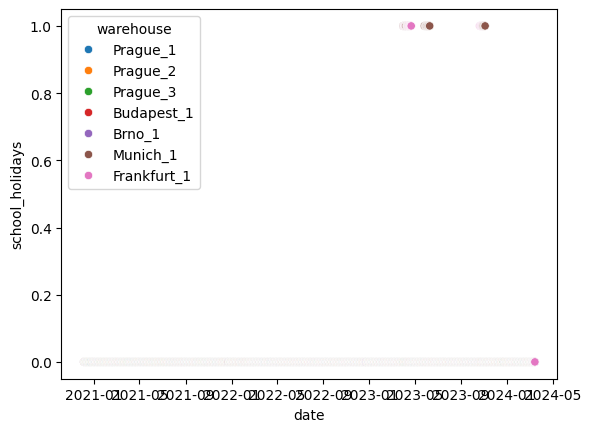

In [84]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="school_holidays", hue="warehouse")

## Date by blackout

<Axes: xlabel='date', ylabel='blackout'>

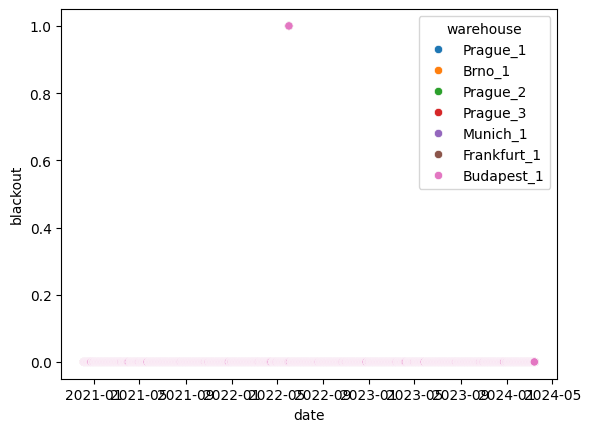

In [33]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="blackout", hue="warehouse")

<Axes: xlabel='date', ylabel='blackout'>

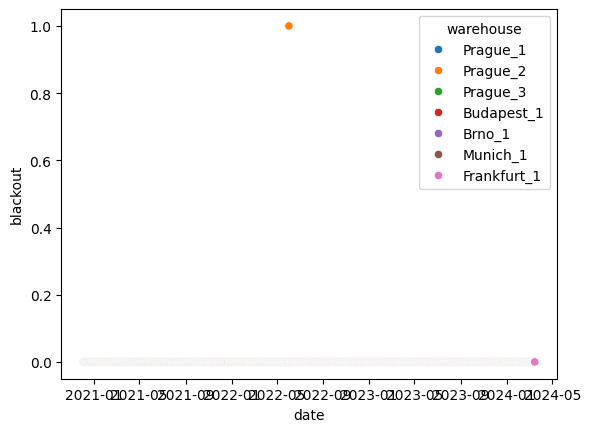

In [86]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="blackout", hue="warehouse")

<Axes: xlabel='date', ylabel='blackout'>

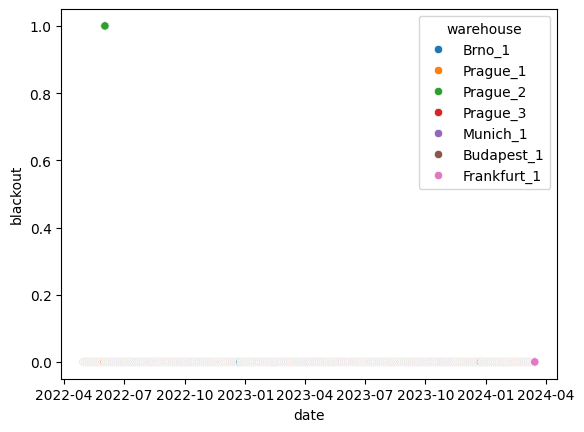

In [87]:
data_subset = train_orders_data[ (train_orders_data['date'] >=   datetime(2022, 5, 1, 0, 0, 0)) & (train_orders_data['date'] <=   datetime(2024, 12, 31, 0, 0, 0))]
sns.scatterplot(data=data_subset, x="date", y="blackout", hue="warehouse")

## Date by mov_change

<Axes: xlabel='date', ylabel='mov_change'>

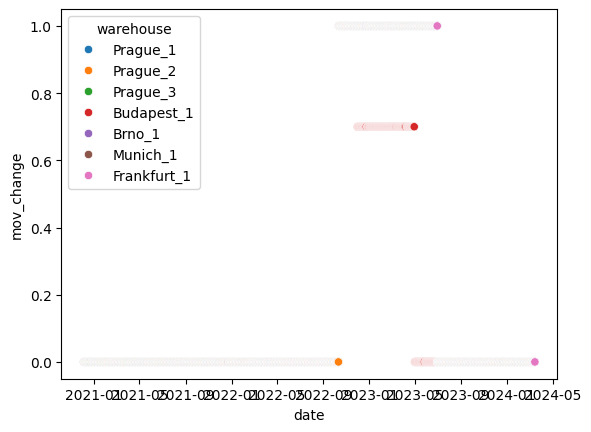

In [88]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="mov_change", hue="warehouse")

<Axes: xlabel='date', ylabel='mov_change'>

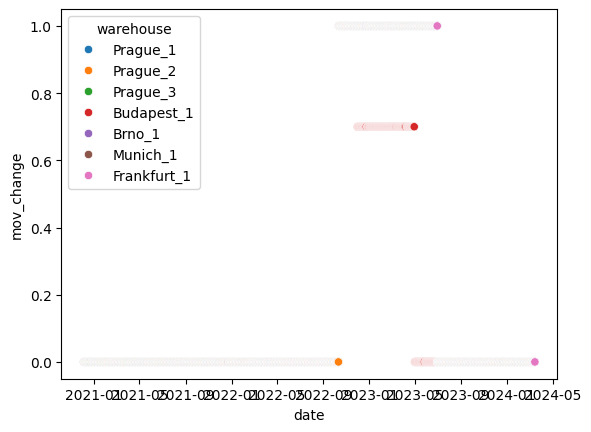

In [89]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="mov_change", hue="warehouse")

## Date by frankfurt_shutdown

<Axes: xlabel='date', ylabel='frankfurt_shutdown'>

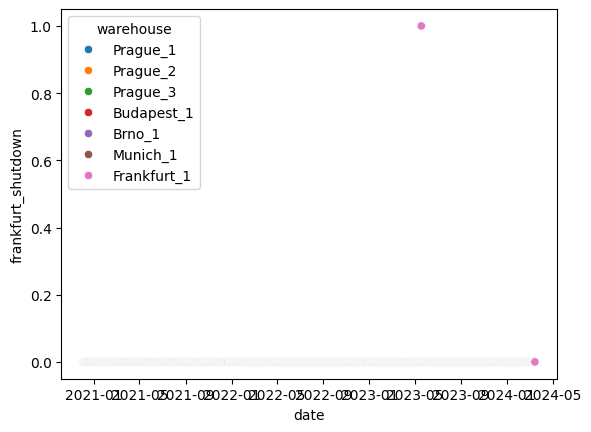

In [90]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="frankfurt_shutdown", hue="warehouse")

## Date by precipitation

<Axes: xlabel='date', ylabel='precipitation'>

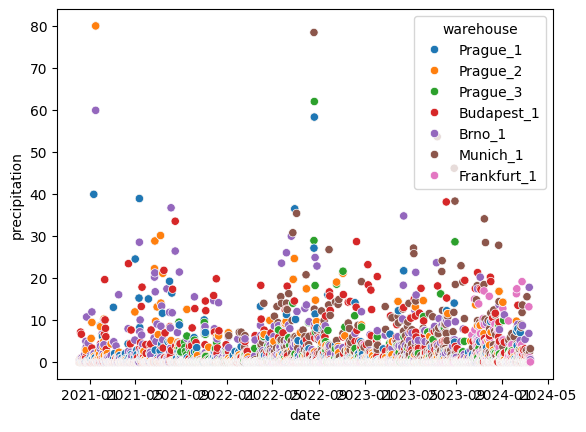

In [91]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="precipitation", hue="warehouse")

## Date by snow

<Axes: xlabel='date', ylabel='snow'>

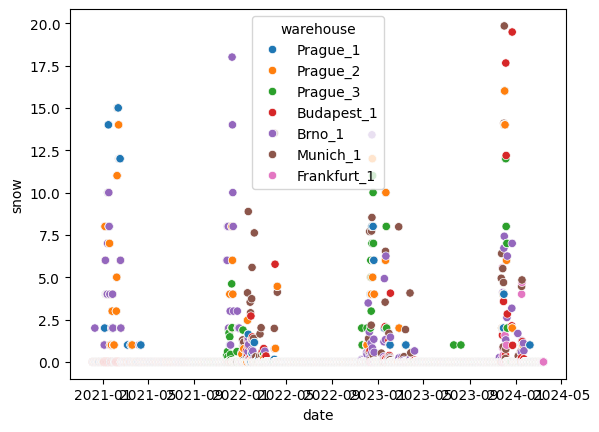

In [92]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="snow", hue="warehouse")

## Date by user_activity_1

<Axes: xlabel='date', ylabel='user_activity_1'>

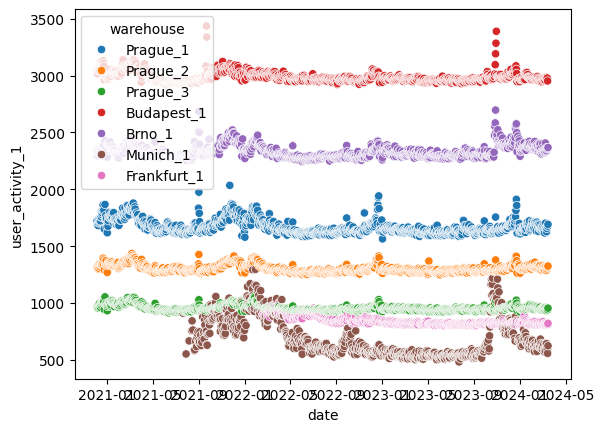

In [93]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="user_activity_1", hue="warehouse")

## Date by user_activity_2

<Axes: xlabel='date', ylabel='user_activity_2'>

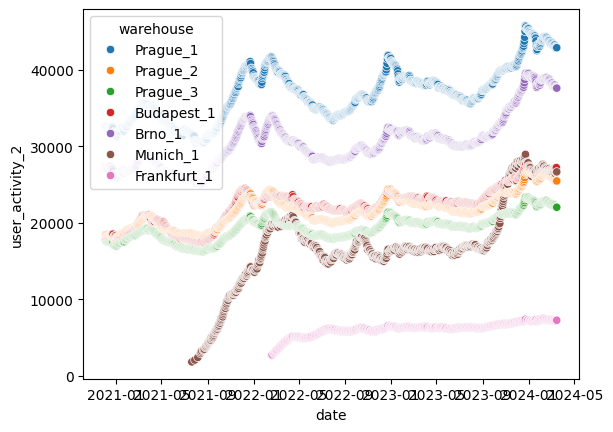

In [94]:
train_orders_data['date'] = pd.to_datetime(train_orders_data['date'])
sns.scatterplot(data=train_orders_data, x="date", y="user_activity_2",hue="warehouse")

## Correlation Matrix

In [10]:
train_orders_data.drop(columns=['holiday_name', 'id', 'date']).head(1)

,warehouse,orders,holiday,shutdown,mini_shutdown,shops_closed,winter_school_holidays,school_holidays,blackout,mov_change,frankfurt_shutdown,precipitation,snow,user_activity_1,user_activity_2
0,Prague_1,6895.0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,1722.0,32575.0


<Axes: >

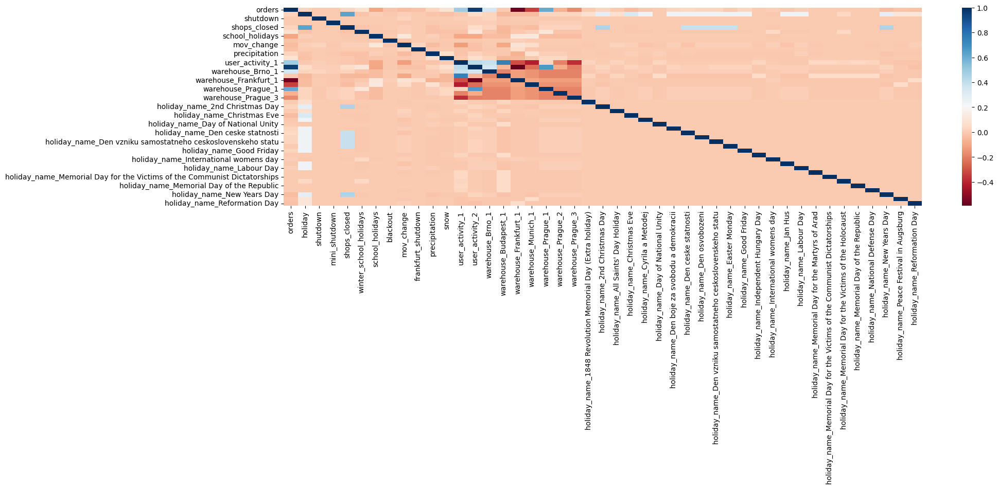

In [22]:
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(round(pd.get_dummies(train_orders_data.drop(columns=['id', 'date'])).corr(), 2), cmap="RdBu")

<Axes: >

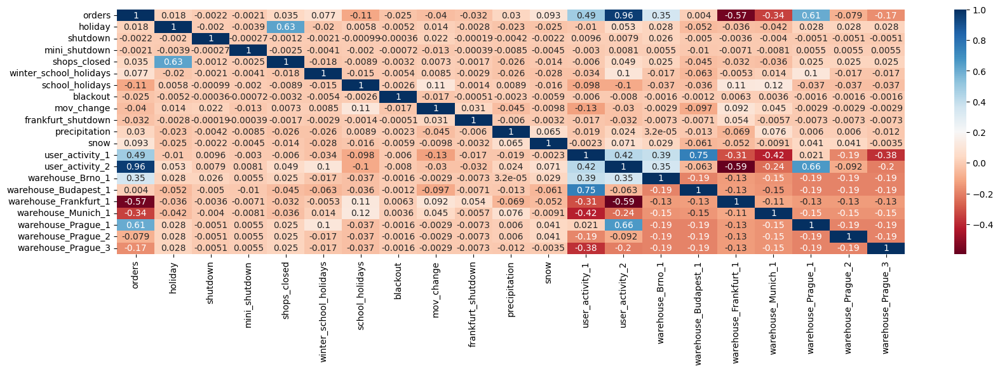

In [17]:
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(pd.get_dummies(train_orders_data.drop(columns=['holiday_name', 'id', 'date'])).corr(), annot=True, axes=ax, cmap="RdBu")

## Baseline Linear Regression Model

In [162]:
train_orders_data.head(1)

,warehouse,date,orders,holiday_name,holiday,shutdown,mini_shutdown,shops_closed,winter_school_holidays,school_holidays,blackout,mov_change,frankfurt_shutdown,precipitation,snow,user_activity_1,user_activity_2,id
0,Prague_1,2020-12-05,6895.0,No Holiday,0,0,0,0,0,0,0,0.0,0,0.0,0.0,1722.0,32575.0,Prague_1_2020-12-05


In [ ]:
#train_orders_data.loc[pd.isnull(train_orders_data['holiday_name'] ), 'holiday_name'] = ["No Holiday"]*7122

In [ ]:
#train_orders_data['Date_Ordinal'] = train_orders_data['date'].map(datetime.toordinal)

In [201]:
train_orders_data.head(1)

,warehouse,date,orders,holiday_name,holiday,shutdown,mini_shutdown,shops_closed,winter_school_holidays,school_holidays,blackout,mov_change,frankfurt_shutdown,precipitation,snow,user_activity_1,user_activity_2,id
0,Prague_1,2020-12-05,6895.0,No Holiday,0,0,0,0,0,0,0,0.0,0,0.0,0.0,1722.0,32575.0,Prague_1_2020-12-05


In [202]:
X = train_orders_data.drop(columns=['id'])
X = pd.get_dummies(X, dtype=int)
X = X.dropna(subset=['precipitation', 'snow'])
X['date'] = train_orders_data['date']

In [203]:
X.head(1)

,orders,holiday,shutdown,mini_shutdown,shops_closed,winter_school_holidays,school_holidays,blackout,mov_change,frankfurt_shutdown,...,holiday_name_Memorial Day for the Martyrs of Arad,holiday_name_Memorial Day for the Victims of the Communist Dictatorships,holiday_name_Memorial Day for the Victims of the Holocaust,holiday_name_Memorial Day of the Republic,holiday_name_National Defense Day,holiday_name_New Years Day,holiday_name_No Holiday,holiday_name_Peace Festival in Augsburg,holiday_name_Reformation Day,date
0,6895.0,0,0,0,0,0,0,0,0.0,0,...,0,0,0,0,0,0,1,0,0,2020-12-05


In [204]:
#y = X['orders']
X = X.drop(columns=['precipitation', 'snow', 'user_activity_1',
       'user_activity_2', 'frankfurt_shutdown', 'shutdown', 'mini_shutdown', 'blackout', 'mov_change', 'precipitation', 'snow', 'user_activity_1',
       'user_activity_2'])

In [206]:
X['date'] = pd.to_datetime(X['date'])

In [207]:
X['date'].max()

Timestamp('2024-03-15 00:00:00')

In [181]:
X['date'].min()

Timestamp('2020-12-05 00:00:00')

In [198]:
train_test_divider_date = X['date'].max() - timedelta(days=60)
train_test_divider_date

Timestamp('2024-01-15 00:00:00')

In [208]:
train_data = X.loc[ X['date'] < train_test_divider_date]
test_data = X.loc[ X['date'] >= train_test_divider_date]


In [210]:
y_train = train_data['orders']
y_test = test_data['orders']
X_train = train_data.drop(columns=['orders','date'])
X_test = test_data.drop(columns=['orders','date'])

In [211]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.compose import make_column_transformer
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline

In [127]:
#column_transformer = make_column_transformer(
#    (StandardScaler(), ['precipitation', 'snow', 'user_activity_1', 'user_activity_2'])
#)

In [212]:
pipe = Pipeline([
      #('preprocess', column_transformer),
       ('linreg', LinearRegression())
])

In [213]:
pipe.fit(X_train, y_train)

Pipeline(steps=[('linreg', LinearRegression())])

In [214]:
pipe.score(X_test, y_test)

0.5656925521106633

# Findings

- We have 2 datasets for training: train_orders_data and train_calendar.
    - All 7340 data points in the train_orders_data are also in the train_calendar.
    - There are some amount of holidays and additional incomplete non-holiday data points that are in the train_calendar, but not in the train_orders_data.
    - The train_orders data also has user activity 1 and user activity 2 features which train_calendar does not have.
    - If needed, we could later on experiment imputing the values for these 2 features and increase our train_orders_dataset

- There are 5 warehouses Brno_1, Budapest_1,Frankfurt_1	0, Munich_1	0, Prague_1, Prague_2, and Prague_3. The Munich_1 and Frankfurt_1 do not have as many holidays as the other warehouses.

- There is a strong positive relationship and correlation between user_activity_2 feature and our target feature orders.

- We can see 2D clusters using user_activity_1 and user_activity_2. We can also see 2D clusters with orders and user_activity_1 features. If we combine user_activity_1, user_activity_2, and orders, then we can observe 3D clusters


- Shutdown, mini_shutdown, blackout, and frankfurt_shutdown are rare occurences. Snow and precipitation and holiday-related variables occur seasonally.


**Baseline Model:** A baseline linear regression model to predict the next 60 days orders had a performance of 57% accuracy.

The next steps will include feature engineering with Linear Regression and Polynomial Regression. I will also explore next ARIMA and SARIMAX for time-series forecasting GridSearchCV will optimize model parameters to identify the best-performing approach.